Notebook used to compute the correlations at ice core drilling sites for runs with only a single predictor variable.

In [1]:
import os
import glob

import numpy as np
import math

import copy
import re
from datetime import datetime

import gzip
import netCDF4 as nc
import pickle

from braceexpand import braceexpand
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

import matplotlib.pyplot as plt
import matplotlib

import cartopy
import cartopy.mpl.geoaxes
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

import cartopy.crs as ccrs
from cartopy.util import add_cyclic_point

In [5]:
DIRECTORY_DATASETS_INTERPOLATED = "Datasets/Interpolated/"
DIRECTORY_DATASETS_ORIGINAL = "Datasets/Original/"
DIRECTORY_IMAGES = "Images/"
DIRECTORY_OUTPUTS = "Output/Compare_variables/"

# Give criteria for the dataset and open all files that match these criteria

In [6]:
def braced_glob(path):
    l = []
    for x in braceexpand(path):
        l.extend(glob.glob(x))
    return l

In [9]:
# dataset parameters. To leave unspecified use: "*"
PREFIX = "HadCM3-flat{-precip*,}"
DO_SHUFFLE = False
ALL_VARIABLES = "*" # np.sort(["temp_1","precip","dO18", "p"])#np.sort(["temp_1","precip","dO18"])  # "*" get all possible combinations 
DSET_NR = "*"
# helping vars
shuffle_dict = {True:"shuffle", False:"no-shuffle", "*": "*"}

# wildcards can be used in this filename.
DATASET_FOLDER = "{}_{}_{}_".format(PREFIX, "*", DSET_NR)#shuffle_dict[DO_SHUFFLE]
DATASET_FOLDER = "*" + "-".join(ALL_VARIABLES) # using "*" + "-".join(ALL_VARIABLES) instead of DATASET_FOLDER + ... makes it possible to use ico folders too.
DATASET_FOLDER = os.path.join(DIRECTORY_OUTPUTS, DATASET_FOLDER)


dataset_description_files = []  # list to collect the paths to the configuration files
dataset_folders = []  # list to collect all the matching folders.
folder_exists = False

print("Data folders matching the given specifications:")
for dirname in braced_glob(DATASET_FOLDER):
    print(dirname)
    folder_exists = True
    dataset_folders.append(dirname)
    dataset_description_files.append(os.path.join(dirname, "dataset-description.gz"))
if folder_exists == False:
    raise OSError("There exists no folder for the given specifications")

dataset_descriptions = []
for i, file in enumerate(dataset_description_files):
    with gzip.open(file, 'rb') as f:
        dataset_descriptions.append(pickle.load(f))

Data folders matching the given specifications:
Output/Compare_variables/HadCM3-flat_no-shuffle_1_dO18-ht-precip-temp_1
Output/Compare_variables/HadCM3-flat_no-shuffle_1_dO18-precip
Output/Compare_variables/HadCM3-flat_no-shuffle_1_dO18-p-precip-temp_1
Output/Compare_variables/HadCM3-flat_no-shuffle_1_dO18-precip-temp_1
Output/Compare_variables/HadCM3-flat_no-shuffle_1_dO18-p
Output/Compare_variables/HadCM3-flat_no-shuffle_1_dO18-temp_1


In [10]:
def check_dict_conditions(dic, conditions):
    """
    Test whether dict "dic" fullfills the given conditions "conditions". 
    The latter are given as a array of key-value pairs.
    """
    for key, value in conditions:
        if key in dic.keys():
            if not dic[key] == value:
                return False
        else:
            return False
    return True

In [11]:
model_descriptions = []
testset_predictions = []
indices_dataset = [] # store the index of the dataset-directory to which each run belongs
model_descriptions_paths = []

# specify the conditions that we want the runs to match
conditions = []#("loss", "MSELoss"),("USE_CYLINDRICAL_PADDING",  True),("USE_COORD_CONV", True), ("S_MODE_TARGETS", ('Pixelwise',))]
               #, ("RUN_NR",1), ("USE_CYLINDRICAL_PADDING",  False),
              #("USE_COORD_CONV", False)]# [("MODELTYPE", "Classical")]


print("Available runs from all previously specified folders, that match specifications:")

for i, dataset_folder in enumerate(dataset_folders):
    subdirs = [d for d in os.listdir(dataset_folder) if os.path.isdir(os.path.join(dataset_folder, d))]
    for subdir in subdirs:
        files = [f for f in os.listdir(os.path.join(dataset_folder, subdir)) if os.path.isfile(os.path.join(dataset_folder, subdir, f))]
        if "model_training_description.gz" in files and "predictions.gz" in files:        
            # this is a valid description of a model run. Store path and print description
            with gzip.open(os.path.join(dataset_folder, subdir, "model_training_description.gz"), 'rb') as f:
                tmp_description = pickle.load(f)
                if check_dict_conditions(tmp_description, conditions):  # check if the description satisfies our conditions
                    model_descriptions.append(tmp_description)      
                    indices_dataset.append(i)
                    model_descriptions_paths.append(os.path.join(dataset_folder, subdir, "model_training_description.gz"))
                    print("Path: ", subdir)
                    # for key, value in model_descriptions[-1].items():
                        # print(key,": ", value)
                    print("\n")
                    if tmp_description["MODELTYPE"] == "UNet":  # if we open a run that was interpolated from an ico grid...
                        fi = os.path.dirname(model_descriptions_paths[-1])
                        tmp_dset = nc.Dataset(fi + "_6_nbs_r_5_nbs_6_cons1.nc")
                        testset_predictions.append(np.array(tmp_dset.variables["dO18"][:])[:,1:-1,:])
                    with gzip.open(os.path.join(dataset_folder, subdir, "predictions.gz"), 'rb') as g:
                        testset_predictions.append(pickle.load(g))       
        else:
            print("Encountered Invalid directory")

Available runs from all previously specified folders, that match specifications:
Path:  -0x2dd2e6e40467f5e3


Path:  -0x64e193a987459dfd


Path:  0x697b2939d4142d35


Path:  -0x227bb2931ff3f84


Path:  -0x125a284862ef9644


Path:  0x35cab9c6267c6ee6


Path:  -0x40ca7d812d7e4dae


Path:  0x2e26beaa8375318a


Path:  -0x4df4ebd7b9ffe104


Path:  0x25fb568982d992d0


Path:  -0x5555db948440932a


Path:  -0xe6446dbee3a9ee7


Path:  -0x174cd9356e8f83c8


Path:  -0xe2517b92d7c4e88


Path:  -0x3f24b757d094c4fe


Path:  -0x53f54ac3f6f93079


Path:  -0x454ec9bb1cdd13f2


Path:  0x617459e0a3c8054


Path:  -0x3f0edbeb44ba3b5f


Path:  0x5d40b28b3ea985f8


Path:  0x21d7b50703268d90


Path:  -0x5a4aff873d2216b0


Path:  0x4e3bf013a3fd8af9


Path:  -0xe9f68c834a33a9f


Path:  0x1b84d2ed593d1f66


Path:  -0x70b791ced20c7881


Path:  -0x4037f9d6974be13d


Path:  0x4e1c800e6c306218


Path:  -0x5aebf78b752c1b60


Path:  -0x4f0f01d27ce67e87


Path:  -0x5de9eb83579e418d


Path:  0x3b864141e8b136dd


Path:  

Check that we can handle the specified target variable and collect the required files.

In [12]:
required_files = []
precip_files = []
for i, description in enumerate(dataset_descriptions):
    # print("Target variable:", description["target_variables"])
    if description["target_variables"] == ["dO18"]:
        required_files.append([])
        precip_files.append([])
        for filename in description["files_used"]:
            if "isotopes" in filename:
                required_files[-1].append(filename)
            if "precip" in filename:
                precip_files[-1].append(filename)
    else:
        raise NotImplementedError("Currently only d18O is a valid target variable.")

# Load data, especially ground truth data

In [13]:
def precip_weighted_yearmon_mean(dataset_path, var_name, precip_path):
    """
    Given the name of the variable and the file where to find it, compute its yearly precip-weighted average value.
    In the yearly average we want to ignore nan's if they occur.
    Assumes that the time-dimension is the first dim: shape = (n_timesteps,...) and that there are no missing/invalid 
    values for precip.
    
    If the variable is precip itself, we just return the (unweighted) average.
    """
    var_dset = nc.Dataset(dataset_path)
    var = var_dset.variables[var_name]
    var_monthly_data = var[:].data
    missing_value = var.missing_value
    var_monthly_data[var_monthly_data==missing_value] = np.nan
    
    precip_dset = nc.Dataset(precip_path)
    precip = precip_dset.variables["precip"]
    precip_monthly_data = precip[:].data
    
    assert precip_monthly_data.shape == var_monthly_data.shape
    
    # make sure that both datasets use the same timeaxis and have the same timestamps
    assert var_dset.variables["t"].calendar == precip_dset.variables["t"].calendar == "360_day"
    assert var_dset.variables["t"].units == precip_dset.variables["t"].units
    assert (var_dset.variables["t"][:] == precip_dset.variables["t"][:]).all()
    
    
    t = precip_dset.variables["t"][:].data
    t_0 = t[0]
    match = re.search(r'\d{4}-\d{2}-\d{2}', precip_dset.variables["t"].units)
    if match is None:
        raise ValueError("No date following the YYY-MM-DD convention found")
    ref_date = datetime.strptime(match.group(), '%Y-%m-%d').date()

    ref_year = ref_date.year
    ref_month = ref_date.month - 1  # months in calendar 1-12, we want 0-11
    ref_day = ref_date.day

    d_year = t_0 // 360
    d_month = (t_0 - d_year*360) // 30
    d_day = (t_0 - d_year*360 - d_month*30) // 1

    d_0 = (ref_day + d_day) % 30
    m_0 = (ref_month + d_month + (ref_day+d_day)//30) % 12
    y_0 = ref_year + d_year + (ref_month + d_month + (ref_day+d_day)//30)//12
    
    t_yr = np.zeros_like(t) # what year are we in in the current screenshot compared to y_0?
    for i in range(len(t)):
        t_year = t[i] // 360
        t_month = (t[i] - t_year*360) // 30
        t_day = (t[i] - t_year*360 - t_month*30) // 1        
        t_yr[i] = (t_year - d_year) + (ref_month + t_month + (ref_day+t_day)//30)//12
    t_yr = t_yr.astype("int")    
    n_years = np.amax(t_yr)+1 
    
    # create weights from precip and masks to deal with nans
    weights = precip_monthly_data
    masked_var = np.ma.MaskedArray(var_monthly_data, mask=np.isnan(var_monthly_data))
    var_yearly_data = np.ma.zeros((n_years, *var_monthly_data.shape[1:]))
    
    if var_name == "precip":
        for i in range(n_years):
            i_mask = (t_yr==i)
            var_yearly_data[i,...] = np.ma.average(masked_var[i_mask,...], axis=0)        
    else:
        for i in range(n_years):
            i_mask = (t_yr==i)
            var_yearly_data[i,...] = np.ma.average(masked_var[i_mask,...], weights=weights[i_mask,...], axis=0)
            
    res = copy.deepcopy(var_yearly_data.data)
    res[var_yearly_data.mask] = np.nan
    return res

In [14]:
# names of datasets to which we want not to be missing at any timestep.
dnames = [DIRECTORY_DATASETS_ORIGINAL+"xnapa_isotopes.nc",\
          DIRECTORY_DATASETS_ORIGINAL+"xnapa_precip.nc",\
          DIRECTORY_DATASETS_ORIGINAL+"xnapa_slp.nc",\
          DIRECTORY_DATASETS_ORIGINAL+"xnapa_temp.nc"]

def get_shared_timesteps(dataset_names):
    """
    Not all datasets share the same timesteps. The biggest problems occur in the slp dataset. We want to exclude all
    time steps where one of the variables is missing
    """
    
    # get indices of elements that are shared for all variables.
    from functools import reduce
    ts = tuple([nc.Dataset(dataset_name,"a").variables["t"][:].data for dataset_name in dataset_names])
    common_dates = reduce(np.intersect1d, ts)
    
    return common_dates

In [15]:
isotopes_all_datasets = []
isotopes_yearly_all_datasets = []
for i in range(len(dataset_descriptions)):
    isotopes_all_datasets.append(nc.Dataset(required_files[i][0], "a"))
    if "monthly" in required_files[i][0]:
        isotopes_yearly_all_datasets.append(nc.Dataset(required_files[i][0].replace("monthly_",""), "a"))
    else:
        isotopes_yearly_all_datasets.append([])

d18O = []

lat = []
lon = []

for i, (dataset, yearly_dataset) in enumerate(zip(isotopes_all_datasets, isotopes_yearly_all_datasets)):
    if "monthly" in required_files[i][0]:
        lat.append(dataset.variables["latitude"][:].data[1:-1])
        lon.append(dataset.variables["longitude"][:])
        
        c_dates = get_shared_timesteps(dnames)
        # get the corresponding indices:
        indices = []
        for k, t in enumerate(yearly_dataset.variables["t"][:].data):
            if t in c_dates:
                indices.append(k)
        indices = np.array(indices)
        index_mask = np.logical_and(yearly_dataset.variables["t"][indices].data // 360 >= 654, \
                                    yearly_dataset.variables["t"][indices].data // 360 < 1654)    
        indices = indices[index_mask]  
        
        # only works if d18O and precip available in any case - 
        # this is always the case where we want to do precip weighting though        
        tmp = precip_weighted_yearmon_mean(required_files[i][0], "dO18", precip_files[i][0])
        d18O.append(np.squeeze(tmp)[indices,1:-1,:])
    else:
        print(dataset.variables.keys())
        lat.append(dataset.variables["latitude"][:].data[1:-1])
        lon.append(dataset.variables["longitude"][:])
        
        c_dates = get_shared_timesteps(dnames)
        # get the corresponding indices:
        indices = []
        for j, t in enumerate(dataset.variables["t"][:].data):
            if t in c_dates:
                indices.append(j)
        indices = np.array(indices)
        index_mask = np.logical_and(dataset.variables["t"][indices].data // 360 >= 654, \
                                    dataset.variables["t"][indices].data // 360 < 1654)    
        indices = indices[index_mask]  
        
        d18O.append(np.squeeze(dataset.variables["dO18"][:].data)[indices,1:-1])

dict_keys(['t', 't_bnds', 'longitude', 'latitude', 'level-1_4', 'level-1_5', 'level-1_6', 'h2o', 'dO18', 'dD'])
dict_keys(['t', 't_bnds', 'longitude', 'latitude', 'level-1_4', 'level-1_5', 'level-1_6', 'h2o', 'dO18', 'dD'])
dict_keys(['t', 't_bnds', 'longitude', 'latitude', 'level-1_4', 'level-1_5', 'level-1_6', 'h2o', 'dO18', 'dD'])
dict_keys(['t', 't_bnds', 'longitude', 'latitude', 'level-1_4', 'level-1_5', 'level-1_6', 'h2o', 'dO18', 'dD'])
dict_keys(['t', 't_bnds', 'longitude', 'latitude', 'level-1_4', 'level-1_5', 'level-1_6', 'h2o', 'dO18', 'dD'])
dict_keys(['t', 't_bnds', 'longitude', 'latitude', 'level-1_4', 'level-1_5', 'level-1_6', 'h2o', 'dO18', 'dD'])


In [16]:
d18O_train = []

d18O_test = []

for i, description in enumerate(dataset_descriptions):
    d18O_train.append(d18O[i][description["indices_train"],...])

    d18O_test.append(d18O[i][description["indices_test"],...])

In [17]:
# in order to compare with the original dataset 
# we need to rescale the prediction based on the standardization that we used in the model

rescaled_predictions = []

for i, description in enumerate(model_descriptions):
    rescaled_predictions.append([])
    for j, mode in enumerate(description["S_MODE_TARGETS"]):
        if mode == "Global":
            std = np.mean(np.std(d18O_train[indices_dataset[i]], axis=(0), keepdims=True), axis=(1,2), keepdims=True)
            std[std==0] = 1
            mean = np.mean(d18O_train[indices_dataset[i]], axis=(0,1,2), keepdims=True)
            rescaled_predictions[-1].append((testset_predictions[i]["predictions"][:,j,...] * std) + mean)             
        elif mode == "Pixelwise":        
            std = np.std(d18O_train[indices_dataset[i]], axis=(0), keepdims=True)
            std[std==0] = 1
            mean = np.mean(d18O_train[indices_dataset[i]], axis=(0), keepdims=True)
            rescaled_predictions[-1].append((testset_predictions[i]["predictions"][:,j,...] * std) + mean)   
        elif mode == "Global_mean_pixelwise_std":
            std = np.mean(np.std(d18O_train[indices_dataset[i]], axis=(0), keepdims=True), axis=(1,2), keepdims=True)
            std[std==0] = 1
            mean = np.mean(d18O_train[indices_dataset[i]], axis=(0), keepdims=True)
            rescaled_predictions[-1].append((testset_predictions[i]["predictions"][:,j,...] * std) + mean)           
        elif mode == "Pixelwise_mean_global_std":
            std = np.std(d18O_train[indices_dataset[i]], axis=(0), keepdims=True)
            std[std==0] = 1
            mean = np.mean(d18O_train[indices_dataset[i]], axis=(0,1,2), keepdims=True)
            rescaled_predictions[-1].append((testset_predictions[i]["predictions"][:,j,...] * std) + mean)  
        elif mode == "None":
            rescaled_predictions[-1].append(testset_predictions[i]["predictions"])
        else:
            raise NotImplementedError("{} is not a valid keyword for standardization".format(mode))
    rescaled_predictions[-1] = np.stack(rescaled_predictions[-1],axis=1)

# Plotting

In [18]:
def plot_regular_lattice_map(data, lat, lon, cmap=None, norm=None, show_continents=True, 
                         figsize=(15,10), projection=ccrs.Robinson(), savename=None):
    """
    Plot a single image given in standard. Assume shape is (lat,lon).
    """
    assert len(data.shape) == 2

    if cmap is None:
        cmap = plt.get_cmap("plasma")
    if norm is None:
        dmin = np.amin(data)
        dmax = np.amax(data)

    fig = plt.figure(figsize=figsize)
    ax = fig.add_subplot(projection=projection)
    ax.set_global()
    #remove white line
    data, lon_plot = add_cyclic_point(data, coord = lon)
    lo, la = np.meshgrid(lon_plot, lat)
    layer = ax.pcolormesh(lo, la, data, transform=ccrs.PlateCarree(), cmap=cmap,norm=norm)    
    
    ax.coastlines(alpha=0.5)
    if savename is not None:
        plt.savefig(DIRECTORY_IMAGES+savename)
    plt.show()

In [19]:
# calibrate colorscale such that all simulations share the same min and max
vmin = min([np.amin(r_pred[0]) for r_pred in rescaled_predictions] + [np.amin(gt[0]) for gt in d18O_test])
vmax = max([np.amax(r_pred[0]) for r_pred in rescaled_predictions] + [np.amax(gt[0]) for gt in d18O_test])

norm = matplotlib.colors.Normalize(vmin=vmin, vmax=vmax, clip=False)

0
MODELTYPE :  UNet_flat
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  3
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 64)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise', 'Pixelwise', 'Global')
S_MODE_TARGETS :  ('Pixelwise',)
loss :  MSELoss
optimizer :  Adam
RUN_NR :  7
#params :  648261


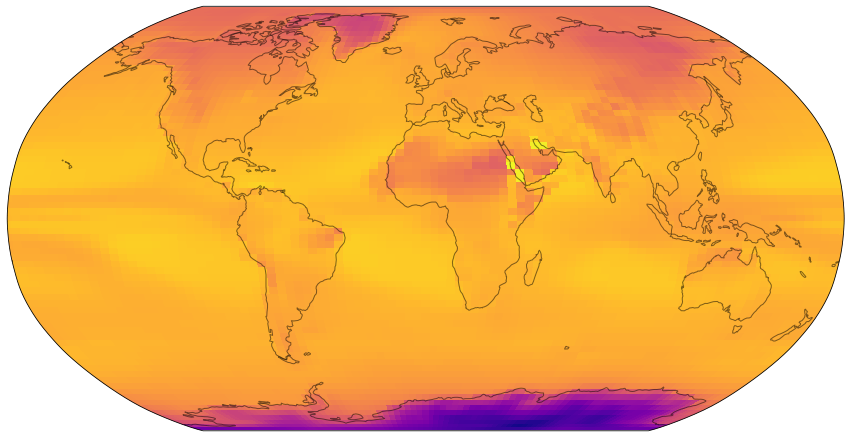

1
MODELTYPE :  UNet_flat
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  3
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 64)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise', 'Pixelwise', 'Global')
S_MODE_TARGETS :  ('Pixelwise',)
loss :  MSELoss
optimizer :  Adam
RUN_NR :  9
#params :  648261


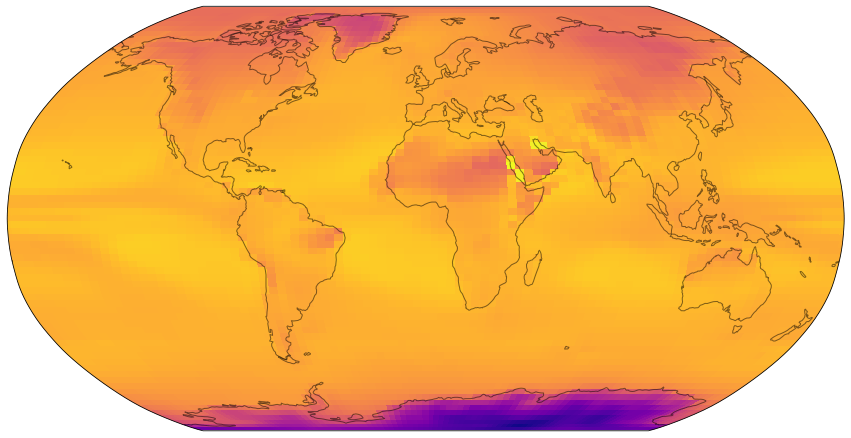

2
MODELTYPE :  UNet_flat
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  3
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 64)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise', 'Pixelwise', 'Global')
S_MODE_TARGETS :  ('Pixelwise',)
loss :  MSELoss
optimizer :  Adam
RUN_NR :  5
#params :  648261


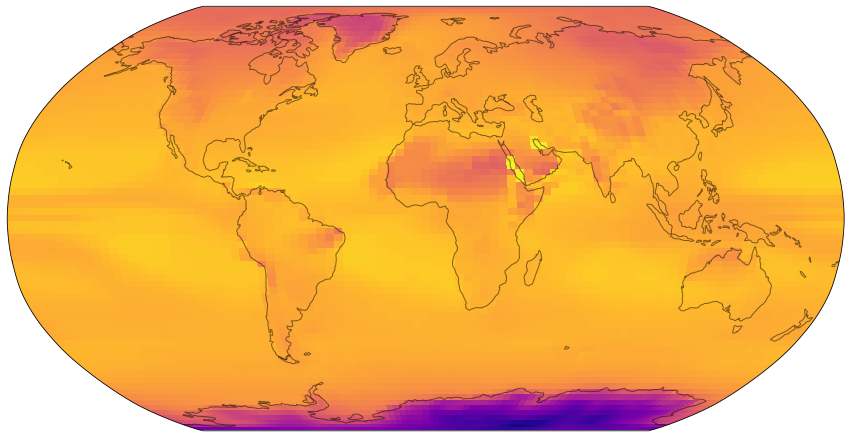

3
MODELTYPE :  UNet_flat
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  3
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 64)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise', 'Pixelwise', 'Global')
S_MODE_TARGETS :  ('Pixelwise',)
loss :  MSELoss
optimizer :  Adam
RUN_NR :  4
#params :  648261


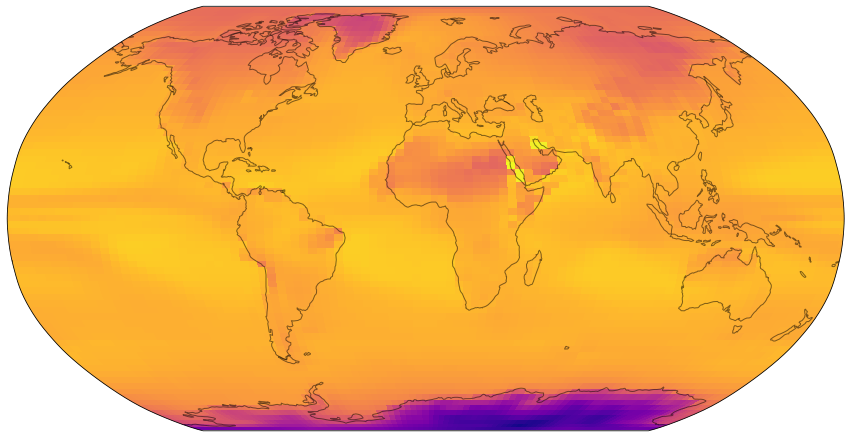

4
MODELTYPE :  UNet_flat
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  3
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 64)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise', 'Pixelwise', 'Global')
S_MODE_TARGETS :  ('Pixelwise',)
loss :  MSELoss
optimizer :  Adam
RUN_NR :  6
#params :  648261


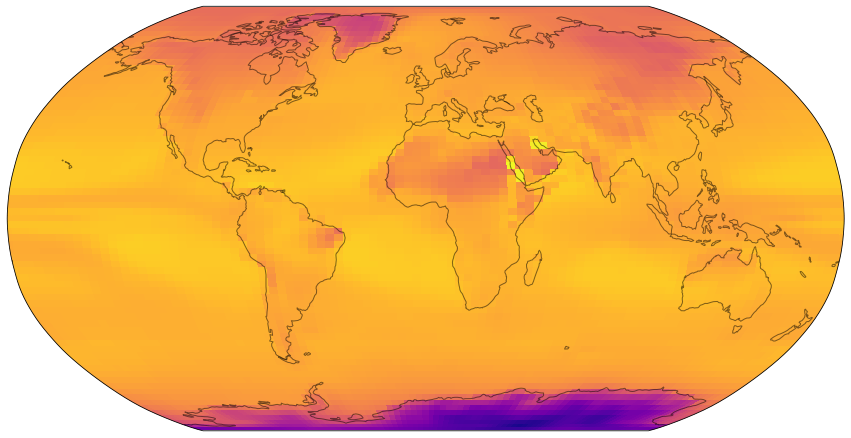

5
MODELTYPE :  UNet_flat
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  3
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 64)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise', 'Pixelwise', 'Global')
S_MODE_TARGETS :  ('Pixelwise',)
loss :  MSELoss
optimizer :  Adam
RUN_NR :  1
#params :  648261


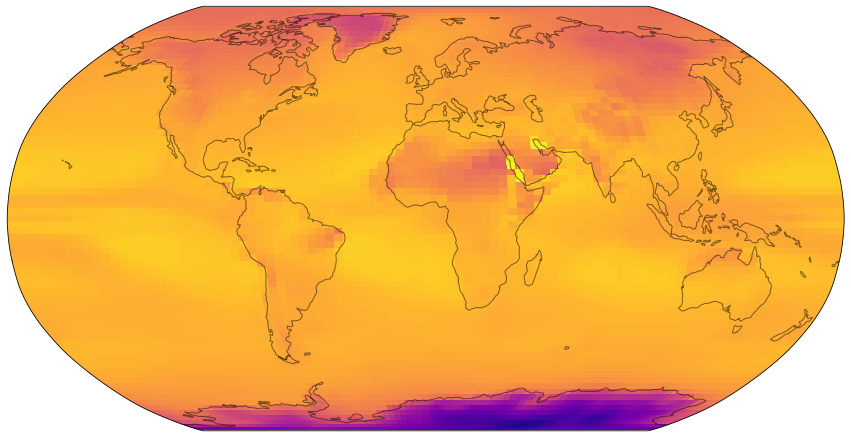

6
MODELTYPE :  UNet_flat
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  3
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 64)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise', 'Pixelwise', 'Global')
S_MODE_TARGETS :  ('Pixelwise',)
loss :  MSELoss
optimizer :  Adam
RUN_NR :  2
#params :  648261


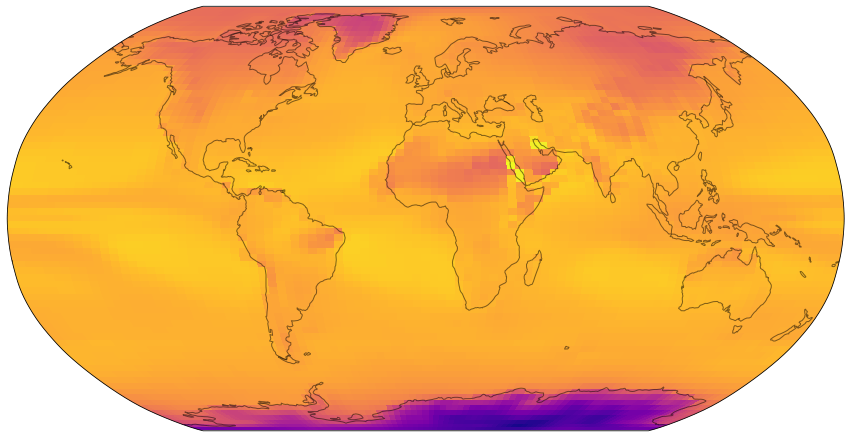

7
MODELTYPE :  UNet_flat
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  3
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 64)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise', 'Pixelwise', 'Global')
S_MODE_TARGETS :  ('Pixelwise',)
loss :  MSELoss
optimizer :  Adam
RUN_NR :  0
#params :  648261


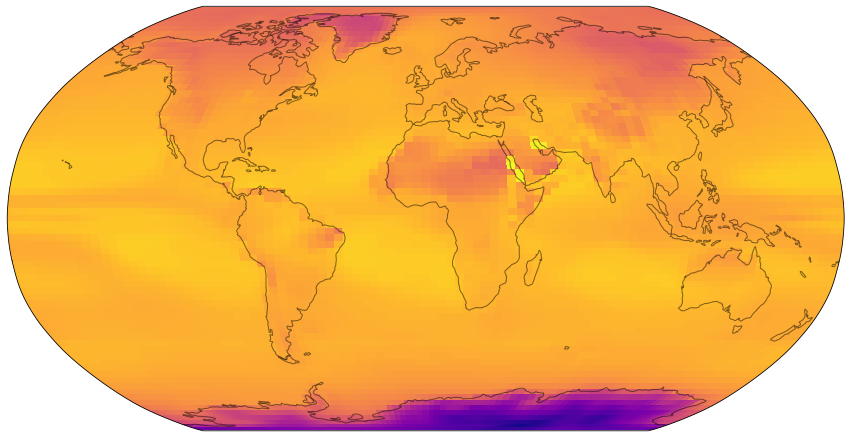

8
MODELTYPE :  UNet_flat
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  3
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 64)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise', 'Pixelwise', 'Global')
S_MODE_TARGETS :  ('Pixelwise',)
loss :  MSELoss
optimizer :  Adam
RUN_NR :  3
#params :  648261


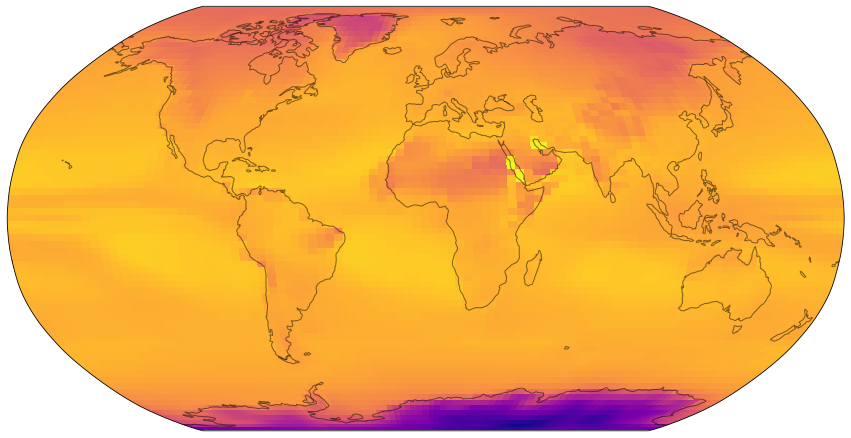

9
MODELTYPE :  UNet_flat
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  3
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 64)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise', 'Pixelwise', 'Global')
S_MODE_TARGETS :  ('Pixelwise',)
loss :  MSELoss
optimizer :  Adam
RUN_NR :  8
#params :  648261


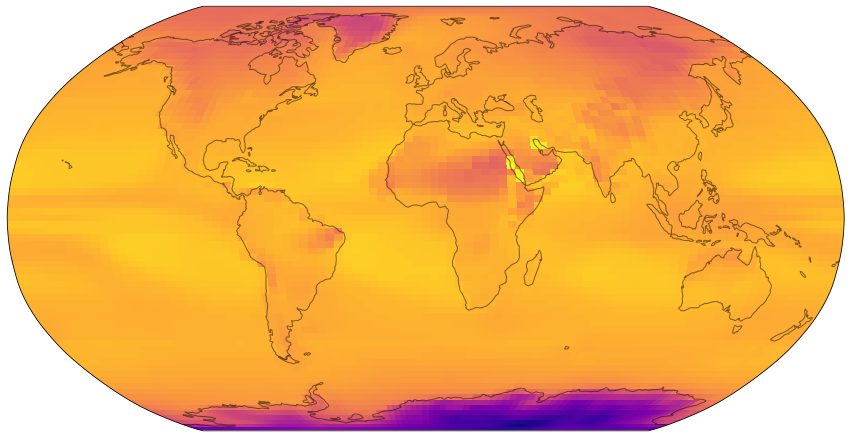

10
MODELTYPE :  UNet_flat
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  1
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 64)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise',)
S_MODE_TARGETS :  ('Pixelwise',)
loss :  MSELoss
optimizer :  Adam
RUN_NR :  2
#params :  647109


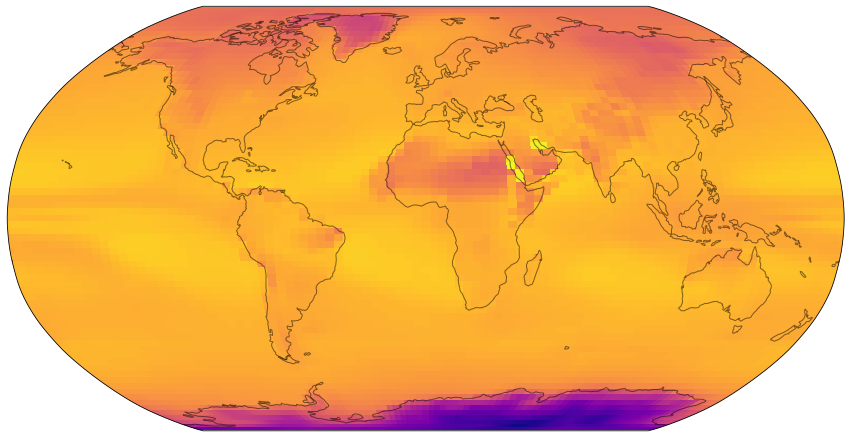

11
MODELTYPE :  UNet_flat
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  1
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 64)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise',)
S_MODE_TARGETS :  ('Pixelwise',)
loss :  MSELoss
optimizer :  Adam
RUN_NR :  5
#params :  647109


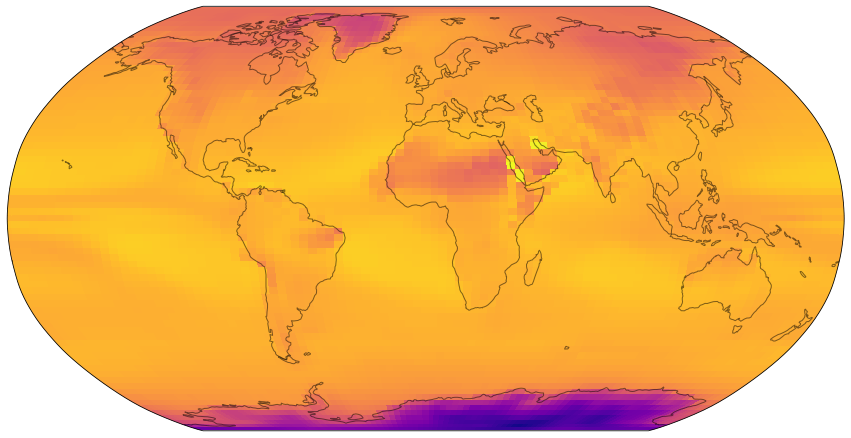

12
MODELTYPE :  UNet_flat
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  1
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 64)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise',)
S_MODE_TARGETS :  ('Pixelwise',)
loss :  MSELoss
optimizer :  Adam
RUN_NR :  6
#params :  647109


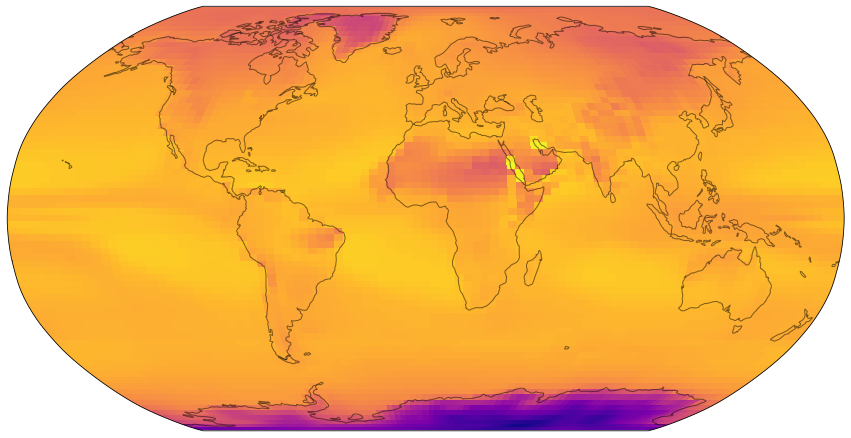

13
MODELTYPE :  UNet_flat
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  1
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 64)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise',)
S_MODE_TARGETS :  ('Pixelwise',)
loss :  MSELoss
optimizer :  Adam
RUN_NR :  3
#params :  647109


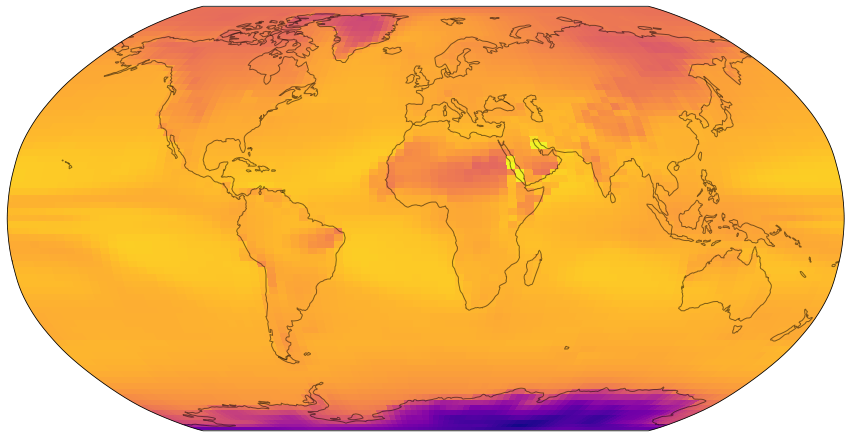

14
MODELTYPE :  UNet_flat
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  1
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 64)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise',)
S_MODE_TARGETS :  ('Pixelwise',)
loss :  MSELoss
optimizer :  Adam
RUN_NR :  1
#params :  647109


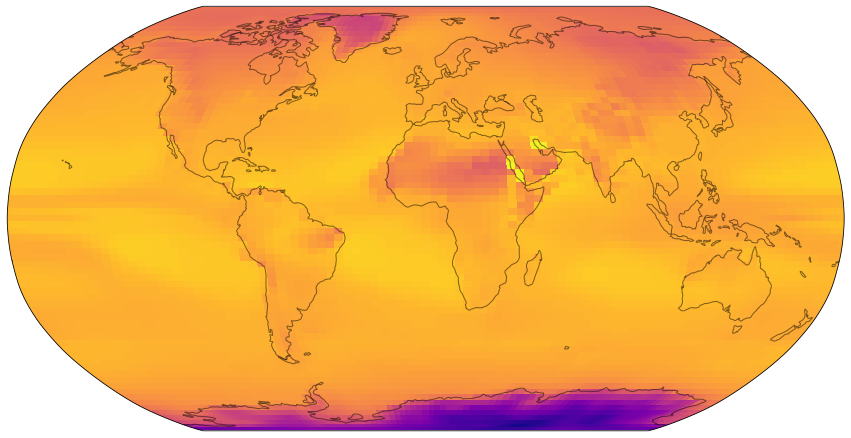

15
MODELTYPE :  UNet_flat
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  1
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 64)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise',)
S_MODE_TARGETS :  ('Pixelwise',)
loss :  MSELoss
optimizer :  Adam
RUN_NR :  9
#params :  647109


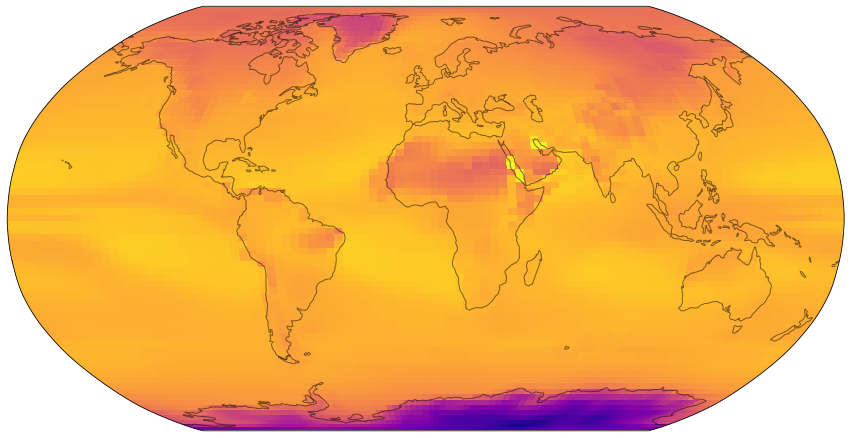

16
MODELTYPE :  UNet_flat
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  1
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 64)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise',)
S_MODE_TARGETS :  ('Pixelwise',)
loss :  MSELoss
optimizer :  Adam
RUN_NR :  0
#params :  647109


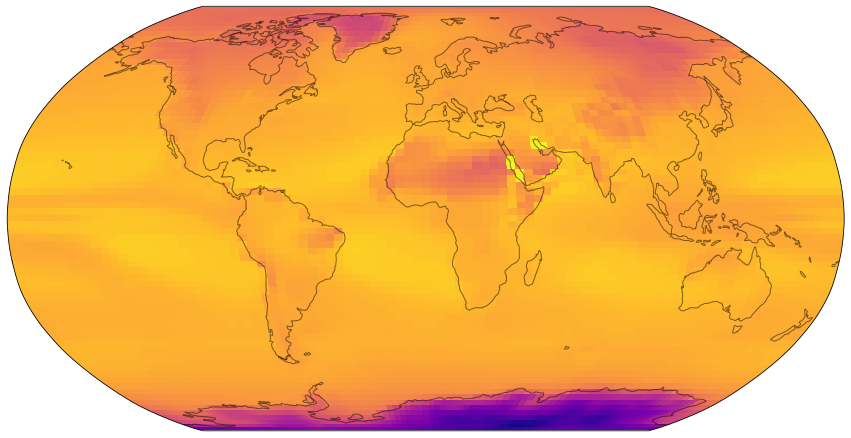

17
MODELTYPE :  UNet_flat
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  1
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 64)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise',)
S_MODE_TARGETS :  ('Pixelwise',)
loss :  MSELoss
optimizer :  Adam
RUN_NR :  8
#params :  647109


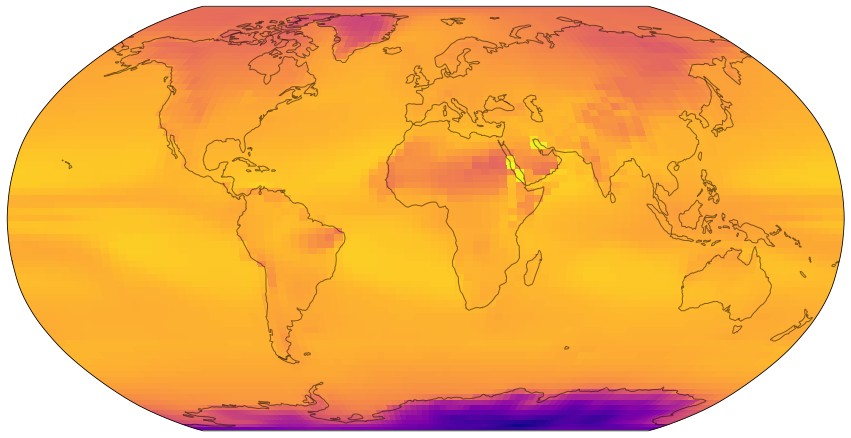

18
MODELTYPE :  UNet_flat
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  1
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 64)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise',)
S_MODE_TARGETS :  ('Pixelwise',)
loss :  MSELoss
optimizer :  Adam
RUN_NR :  7
#params :  647109


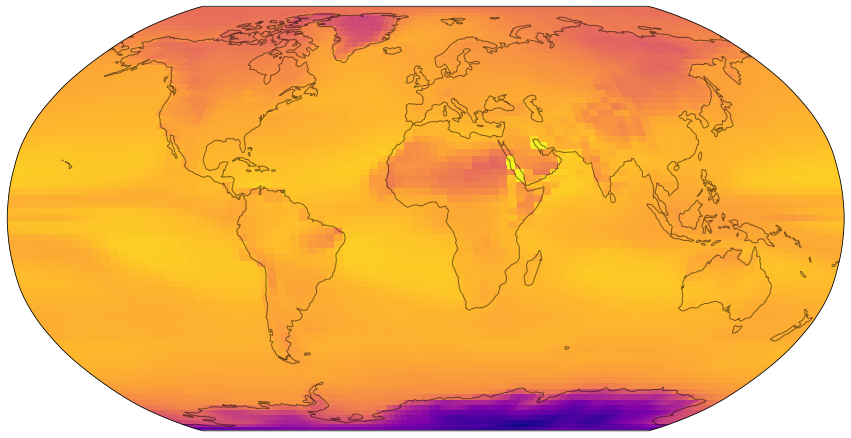

19
MODELTYPE :  UNet_flat
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  1
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 64)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise',)
S_MODE_TARGETS :  ('Pixelwise',)
loss :  MSELoss
optimizer :  Adam
RUN_NR :  4
#params :  647109


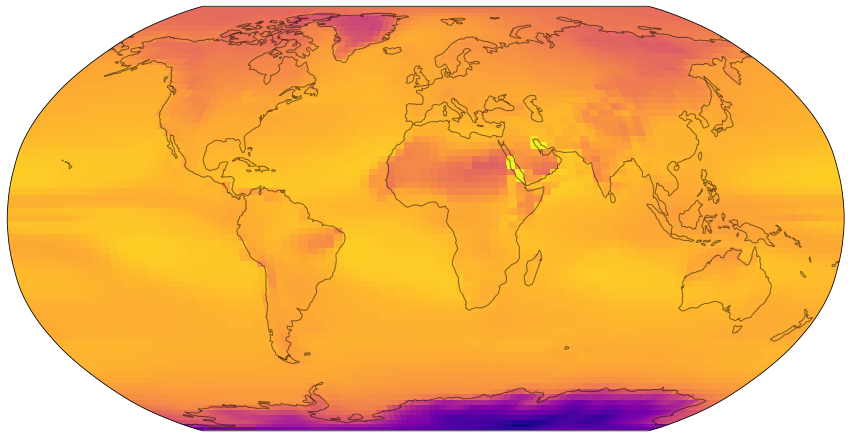

20
MODELTYPE :  UNet_flat
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  3
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 64)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise', 'Pixelwise', 'Pixelwise')
S_MODE_TARGETS :  ('Pixelwise',)
loss :  AreaWeightedMSELoss
optimizer :  Adam
RUN_NR :  6
#params :  648261


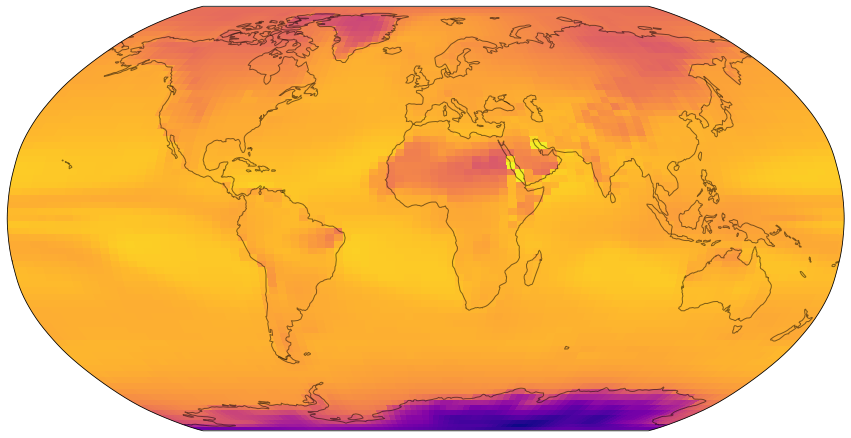

21
MODELTYPE :  UNet_flat
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  3
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 64)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise', 'Pixelwise', 'Pixelwise')
S_MODE_TARGETS :  ('Pixelwise',)
loss :  AreaWeightedMSELoss
optimizer :  Adam
RUN_NR :  4
#params :  648261


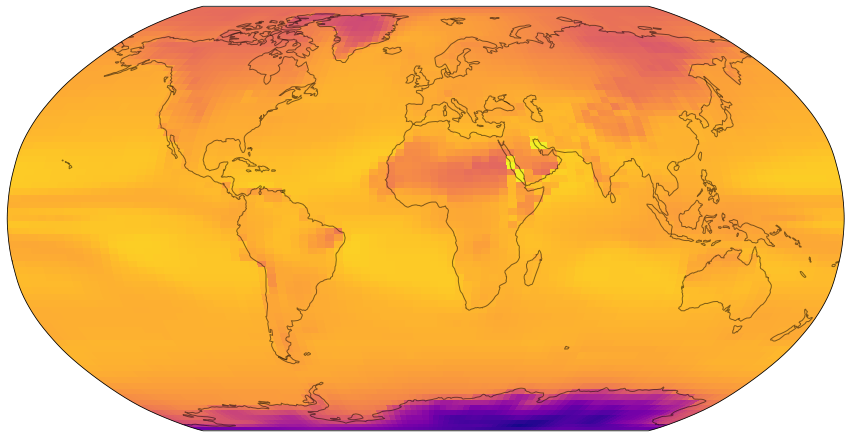

22
MODELTYPE :  UNet_flat
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  3
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 64)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise', 'Pixelwise', 'Pixelwise')
S_MODE_TARGETS :  ('Pixelwise',)
loss :  AreaWeightedMSELoss
optimizer :  Adam
RUN_NR :  1
#params :  648261


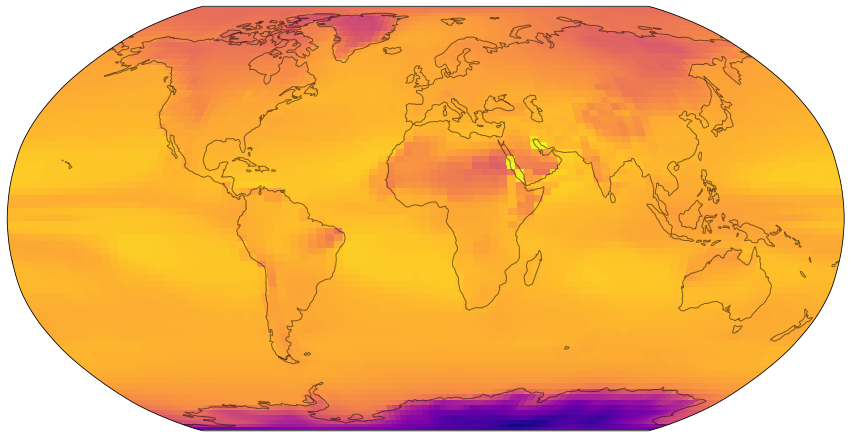

23
MODELTYPE :  UNet_flat
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  3
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 64)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise', 'Pixelwise', 'Pixelwise')
S_MODE_TARGETS :  ('Pixelwise',)
loss :  AreaWeightedMSELoss
optimizer :  Adam
RUN_NR :  0
#params :  648261


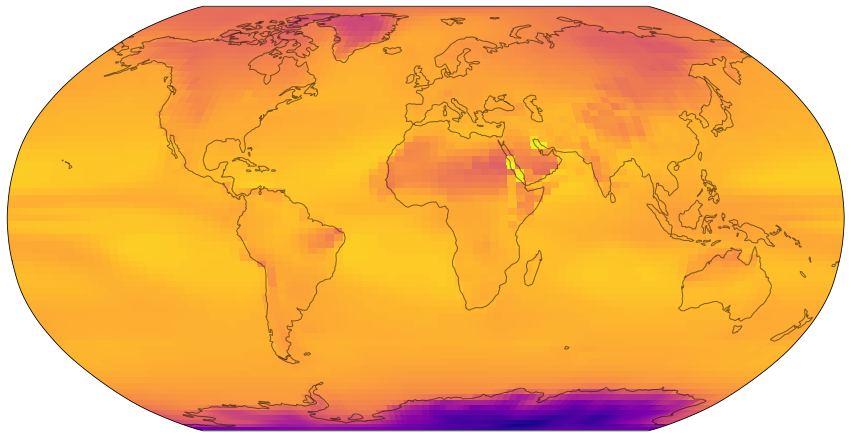

24
MODELTYPE :  UNet_flat
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  3
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 64)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise', 'Pixelwise', 'Pixelwise')
S_MODE_TARGETS :  ('Pixelwise',)
loss :  AreaWeightedMSELoss
optimizer :  Adam
RUN_NR :  5
#params :  648261


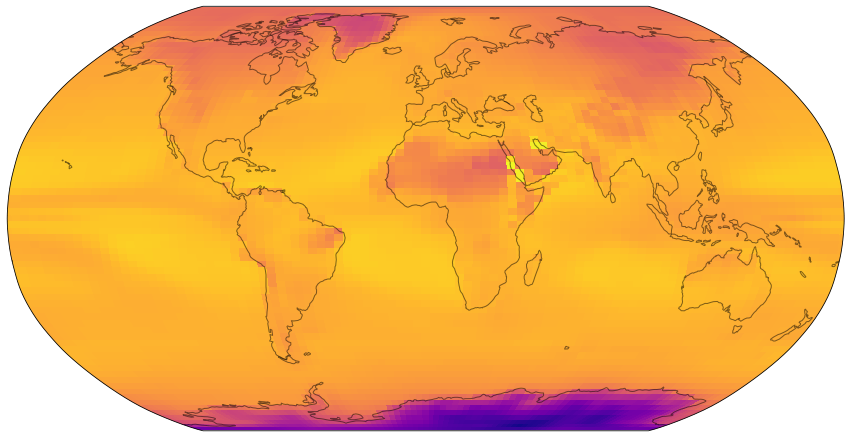

25
MODELTYPE :  UNet_flat
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  3
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 64)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise', 'Pixelwise', 'Pixelwise')
S_MODE_TARGETS :  ('Pixelwise',)
loss :  AreaWeightedMSELoss
optimizer :  Adam
RUN_NR :  3
#params :  648261


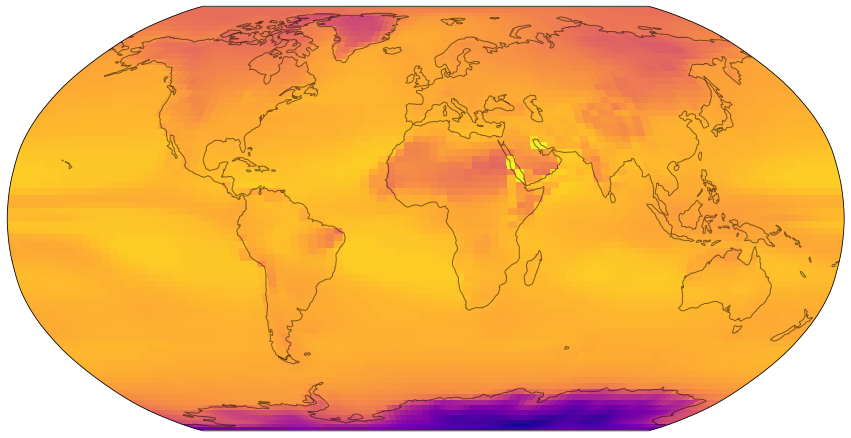

26
MODELTYPE :  UNet_flat
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  3
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 64)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise', 'Pixelwise', 'Pixelwise')
S_MODE_TARGETS :  ('Pixelwise',)
loss :  AreaWeightedMSELoss
optimizer :  Adam
RUN_NR :  9
#params :  648261


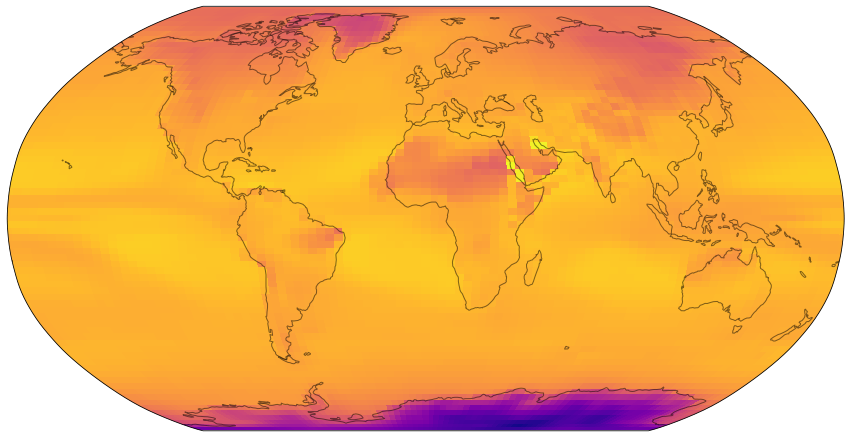

27
MODELTYPE :  UNet_flat
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  3
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 64)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise', 'Pixelwise', 'Pixelwise')
S_MODE_TARGETS :  ('Pixelwise',)
loss :  AreaWeightedMSELoss
optimizer :  Adam
RUN_NR :  2
#params :  648261


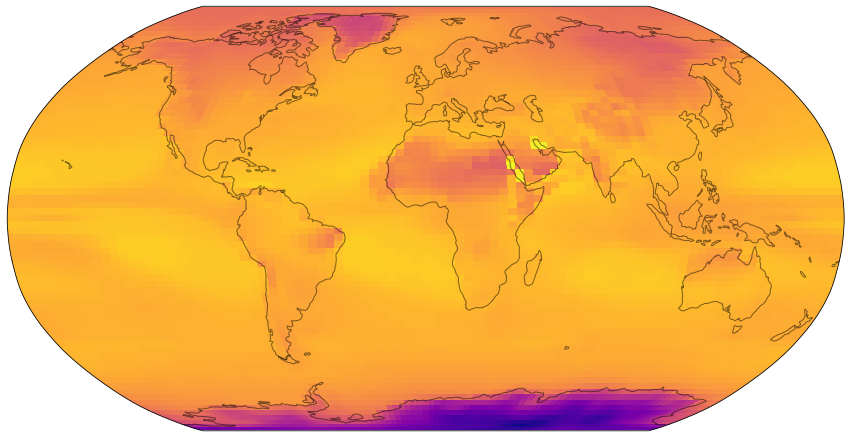

28
MODELTYPE :  UNet_flat
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  3
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 64)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise', 'Pixelwise', 'Pixelwise')
S_MODE_TARGETS :  ('Pixelwise',)
loss :  AreaWeightedMSELoss
optimizer :  Adam
RUN_NR :  7
#params :  648261


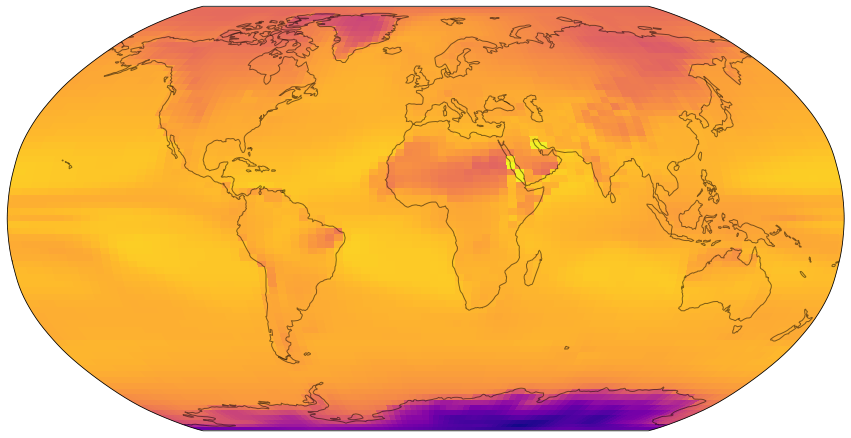

29
MODELTYPE :  UNet_flat
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  3
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 64)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise', 'Pixelwise', 'Pixelwise')
S_MODE_TARGETS :  ('Pixelwise',)
loss :  AreaWeightedMSELoss
optimizer :  Adam
RUN_NR :  8
#params :  648261


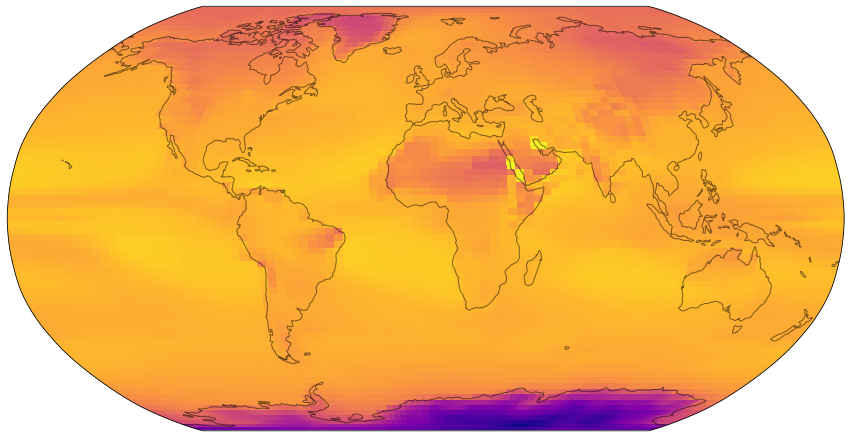

30
MODELTYPE :  UNet_flat
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  2
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 64)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise', 'Pixelwise')
S_MODE_TARGETS :  ('Pixelwise',)
loss :  MSELoss
optimizer :  Adam
RUN_NR :  6
#params :  647685


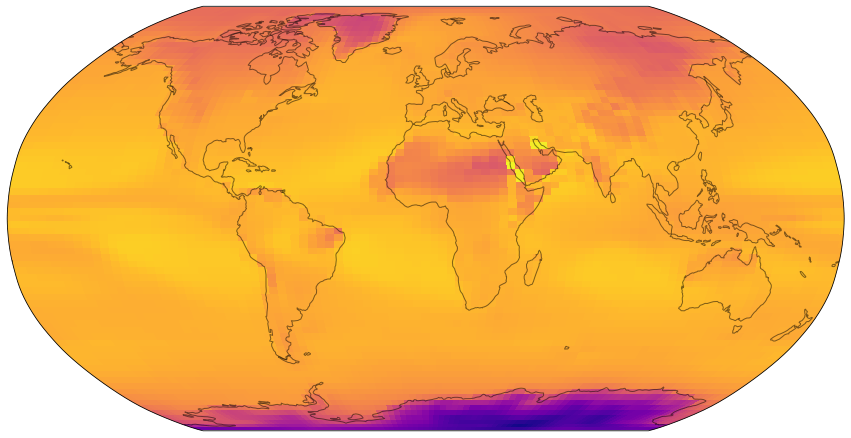

31
MODELTYPE :  UNet_flat
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  2
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 64)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise', 'Pixelwise')
S_MODE_TARGETS :  ('Pixelwise',)
loss :  MSELoss
optimizer :  Adam
RUN_NR :  1
#params :  647685


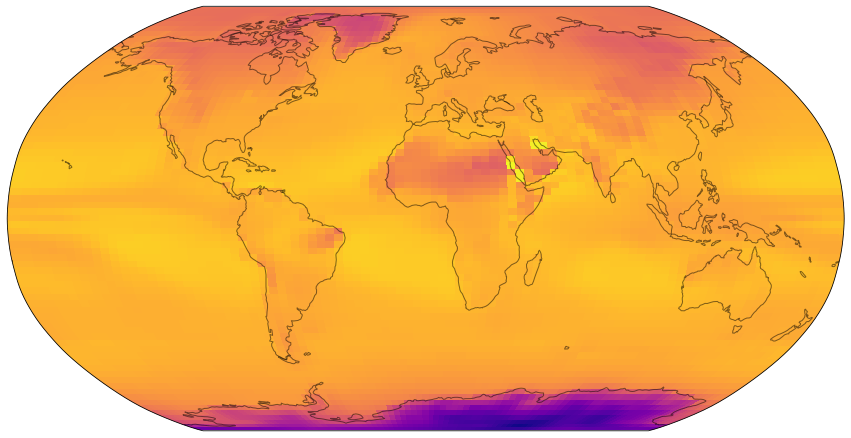

32
MODELTYPE :  UNet_flat
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  2
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 64)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise', 'Pixelwise')
S_MODE_TARGETS :  ('Pixelwise',)
loss :  MSELoss
optimizer :  Adam
RUN_NR :  0
#params :  647685


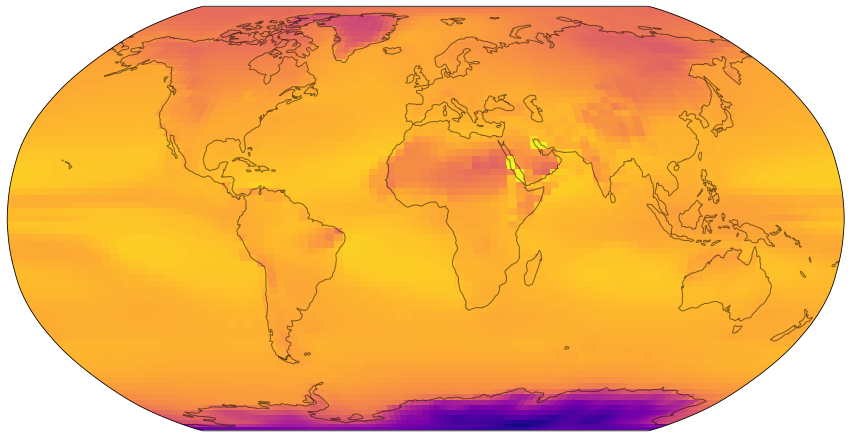

33
MODELTYPE :  UNet_flat
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  2
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 64)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise', 'Pixelwise')
S_MODE_TARGETS :  ('Pixelwise',)
loss :  MSELoss
optimizer :  Adam
RUN_NR :  8
#params :  647685


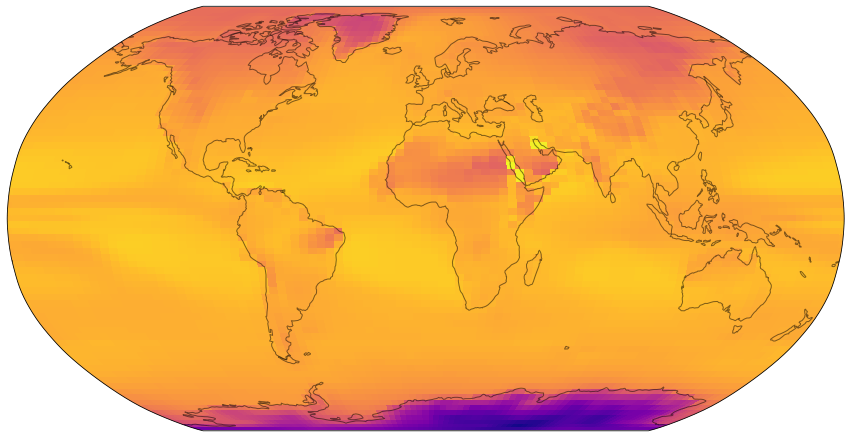

34
MODELTYPE :  UNet_flat
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  2
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 64)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise', 'Pixelwise')
S_MODE_TARGETS :  ('Pixelwise',)
loss :  MSELoss
optimizer :  Adam
RUN_NR :  7
#params :  647685


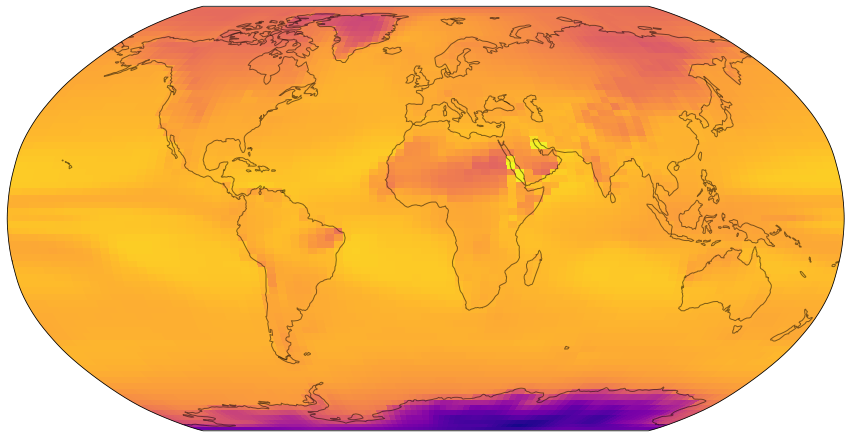

35
MODELTYPE :  UNet_flat
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  2
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 64)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise', 'Pixelwise')
S_MODE_TARGETS :  ('Pixelwise',)
loss :  MSELoss
optimizer :  Adam
RUN_NR :  4
#params :  647685


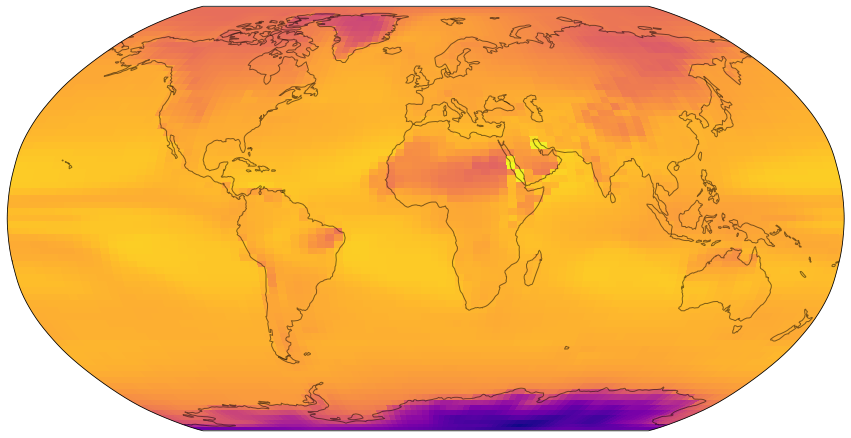

36
MODELTYPE :  UNet_flat
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  2
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 64)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise', 'Pixelwise')
S_MODE_TARGETS :  ('Pixelwise',)
loss :  MSELoss
optimizer :  Adam
RUN_NR :  3
#params :  647685


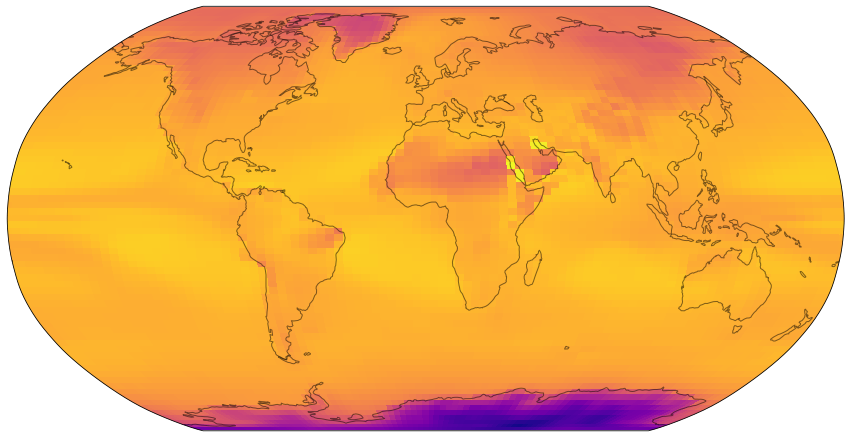

37
MODELTYPE :  UNet_flat
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  2
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 64)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise', 'Pixelwise')
S_MODE_TARGETS :  ('Pixelwise',)
loss :  MSELoss
optimizer :  Adam
RUN_NR :  9
#params :  647685


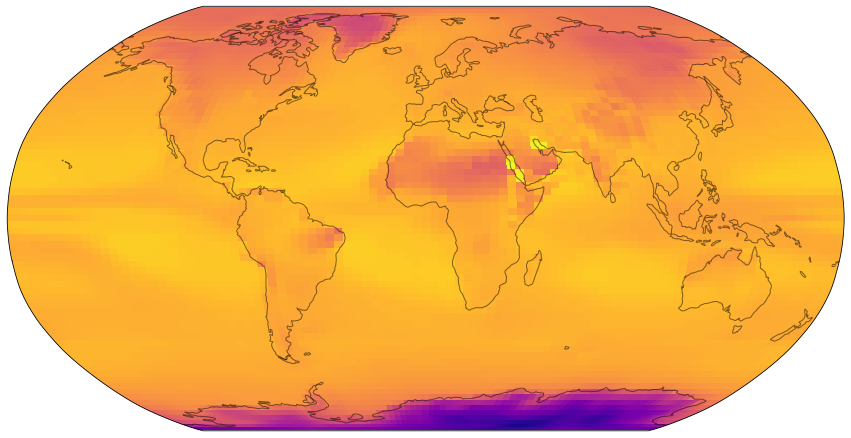

38
MODELTYPE :  UNet_flat
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  2
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 64)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise', 'Pixelwise')
S_MODE_TARGETS :  ('Pixelwise',)
loss :  MSELoss
optimizer :  Adam
RUN_NR :  2
#params :  647685


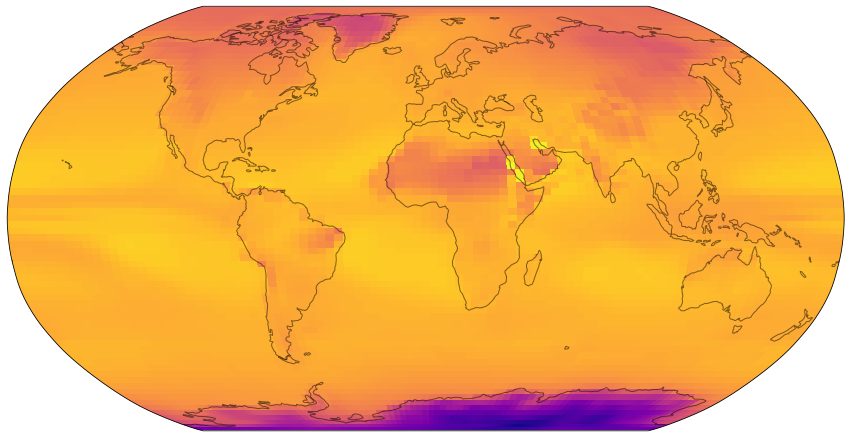

39
MODELTYPE :  UNet_flat
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  2
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 64)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise', 'Pixelwise')
S_MODE_TARGETS :  ('Pixelwise',)
loss :  MSELoss
optimizer :  Adam
RUN_NR :  5
#params :  647685


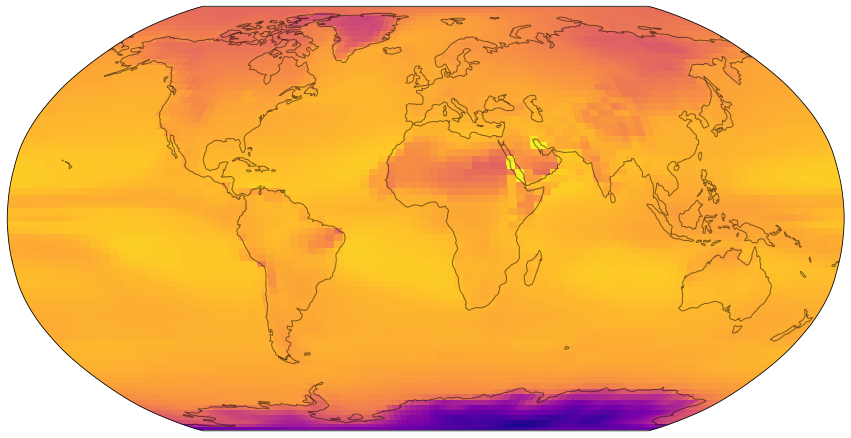

40
MODELTYPE :  UNet_flat
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  1
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 64)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise',)
S_MODE_TARGETS :  ('Pixelwise',)
loss :  MSELoss
optimizer :  Adam
RUN_NR :  2
#params :  647109


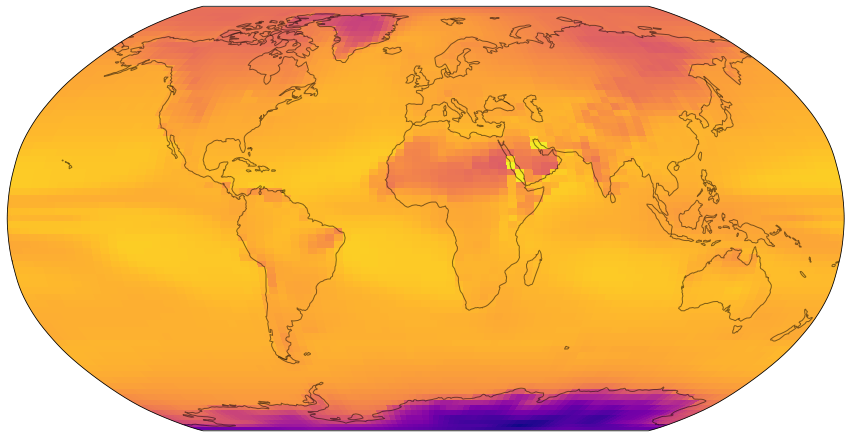

41
MODELTYPE :  UNet_flat
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  1
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 64)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise',)
S_MODE_TARGETS :  ('Pixelwise',)
loss :  MSELoss
optimizer :  Adam
RUN_NR :  5
#params :  647109


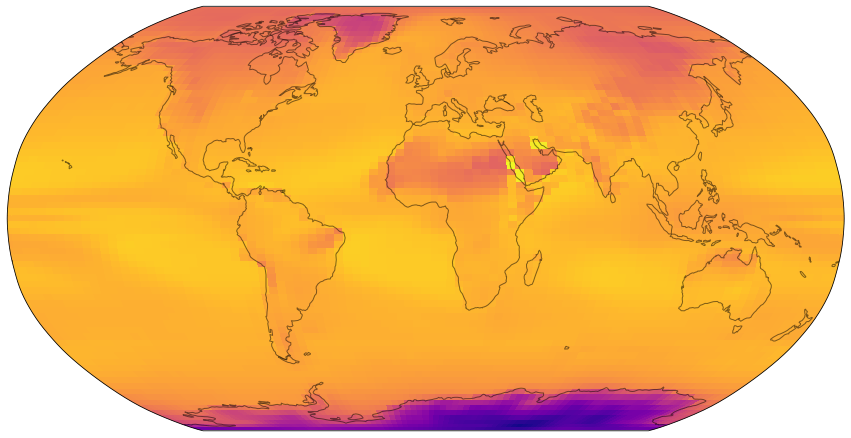

42
MODELTYPE :  UNet_flat
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  1
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 64)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise',)
S_MODE_TARGETS :  ('Pixelwise',)
loss :  MSELoss
optimizer :  Adam
RUN_NR :  6
#params :  647109


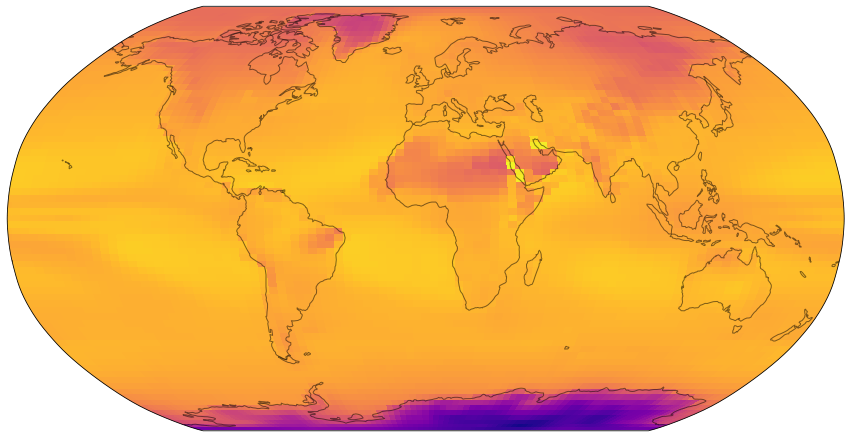

43
MODELTYPE :  UNet_flat
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  1
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 64)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise',)
S_MODE_TARGETS :  ('Pixelwise',)
loss :  MSELoss
optimizer :  Adam
RUN_NR :  3
#params :  647109


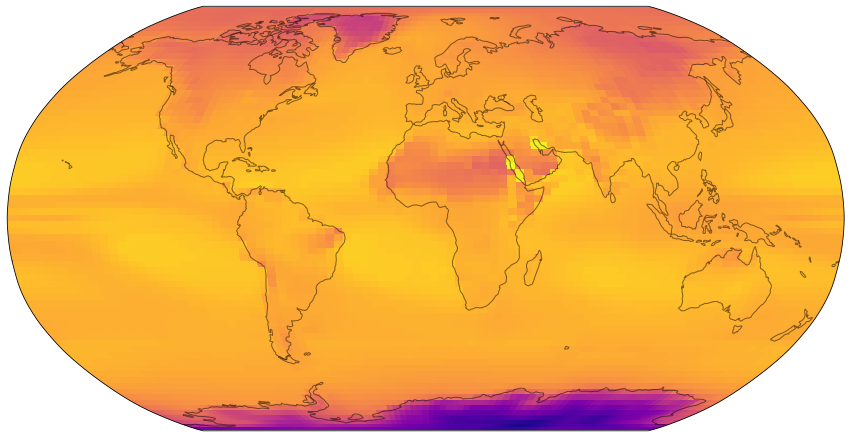

44
MODELTYPE :  UNet_flat
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  1
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 64)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise',)
S_MODE_TARGETS :  ('Pixelwise',)
loss :  MSELoss
optimizer :  Adam
RUN_NR :  1
#params :  647109


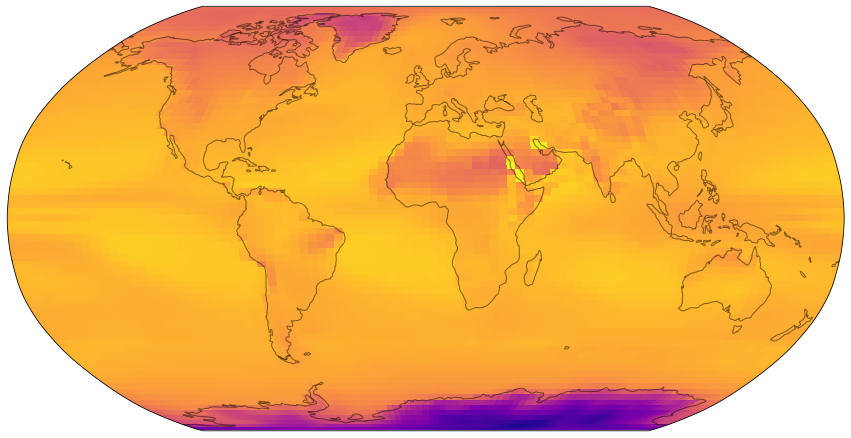

45
MODELTYPE :  UNet_flat
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  1
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 64)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise',)
S_MODE_TARGETS :  ('Pixelwise',)
loss :  MSELoss
optimizer :  Adam
RUN_NR :  9
#params :  647109


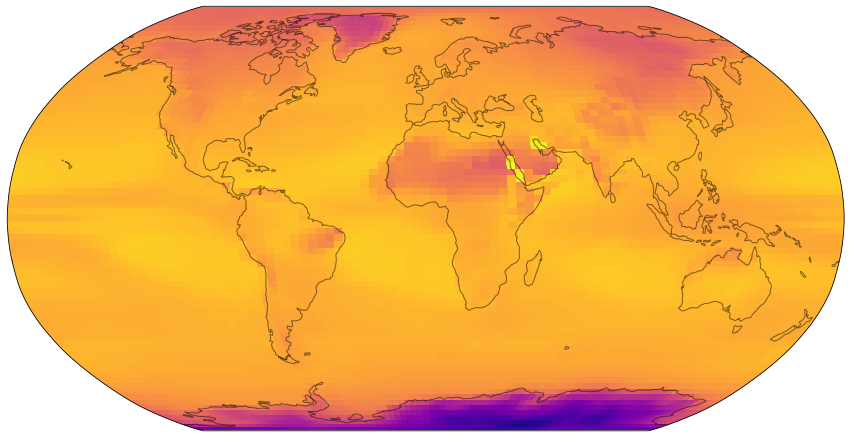

46
MODELTYPE :  UNet_flat
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  1
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 64)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise',)
S_MODE_TARGETS :  ('Pixelwise',)
loss :  MSELoss
optimizer :  Adam
RUN_NR :  0
#params :  647109


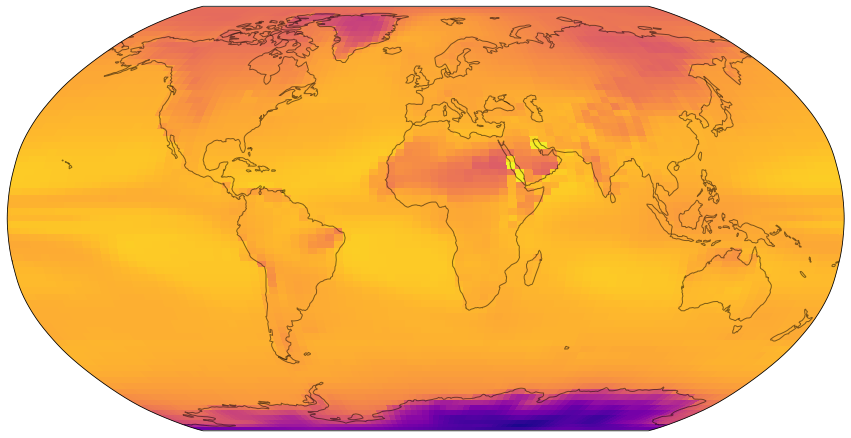

47
MODELTYPE :  UNet_flat
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  1
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 64)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise',)
S_MODE_TARGETS :  ('Pixelwise',)
loss :  MSELoss
optimizer :  Adam
RUN_NR :  8
#params :  647109


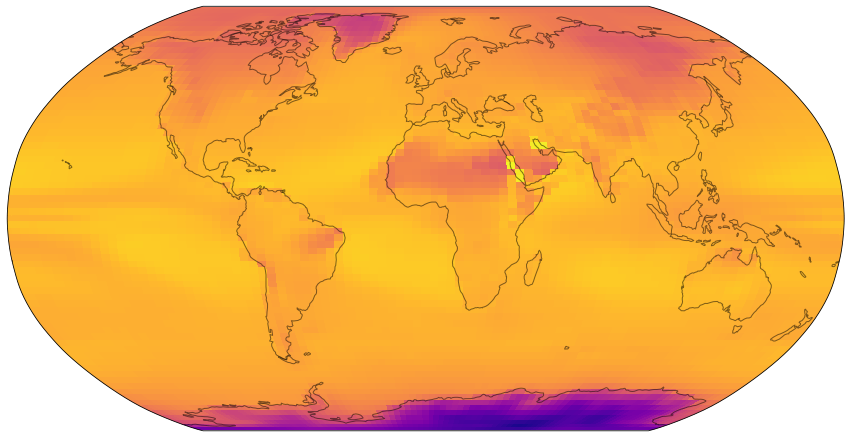

48
MODELTYPE :  UNet_flat
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  1
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 64)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise',)
S_MODE_TARGETS :  ('Pixelwise',)
loss :  MSELoss
optimizer :  Adam
RUN_NR :  7
#params :  647109


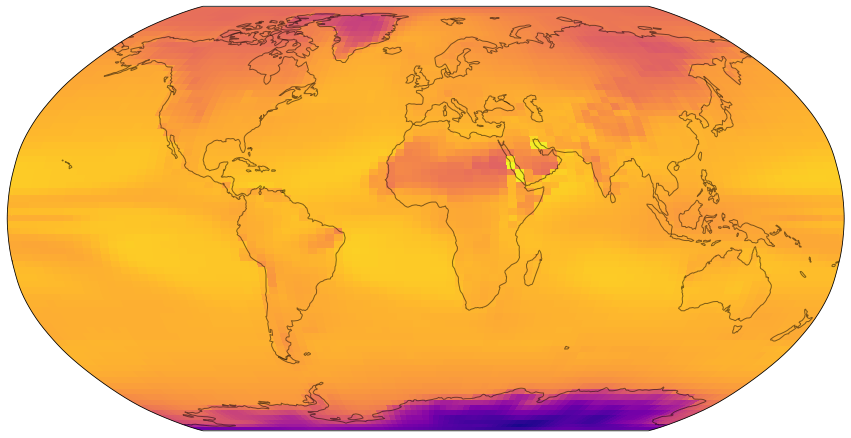

49
MODELTYPE :  UNet_flat
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  1
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 64)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise',)
S_MODE_TARGETS :  ('Pixelwise',)
loss :  MSELoss
optimizer :  Adam
RUN_NR :  4
#params :  647109


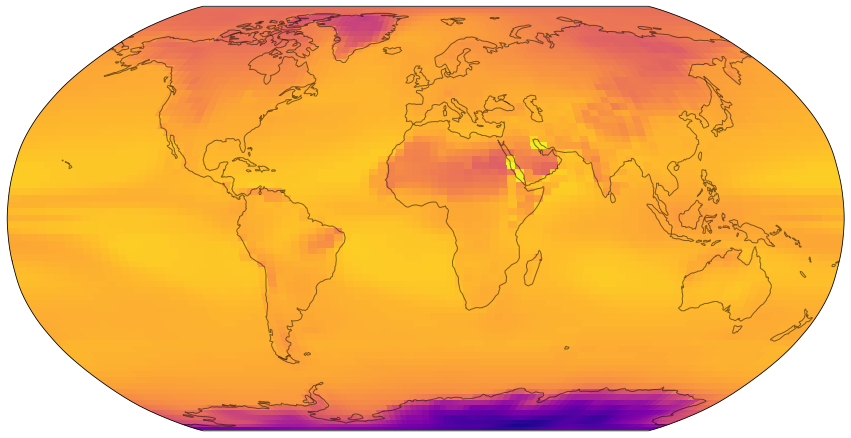

50
MODELTYPE :  UNet_flat
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  1
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 64)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise',)
S_MODE_TARGETS :  ('Pixelwise',)
loss :  MSELoss
optimizer :  Adam
RUN_NR :  2
#params :  647109


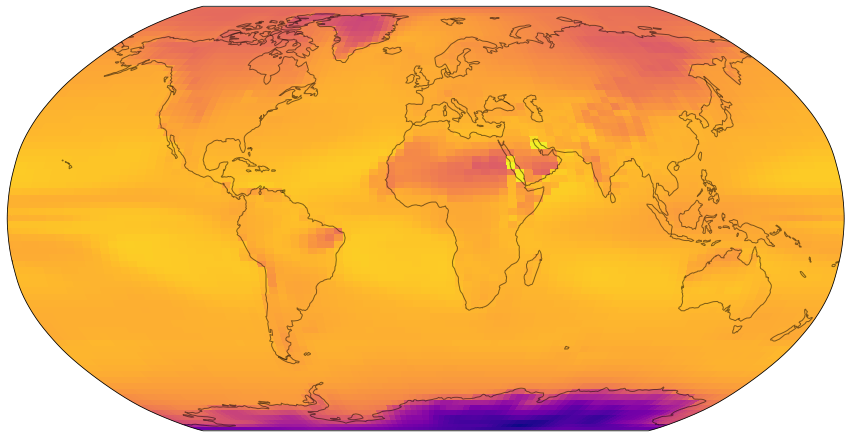

51
MODELTYPE :  UNet_flat
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  1
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 64)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise',)
S_MODE_TARGETS :  ('Pixelwise',)
loss :  MSELoss
optimizer :  Adam
RUN_NR :  5
#params :  647109


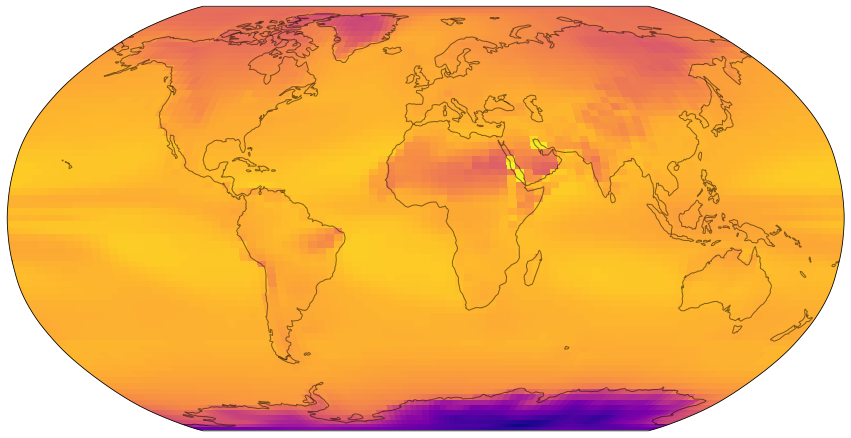

52
MODELTYPE :  UNet_flat
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  1
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 64)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise',)
S_MODE_TARGETS :  ('Pixelwise',)
loss :  MSELoss
optimizer :  Adam
RUN_NR :  6
#params :  647109


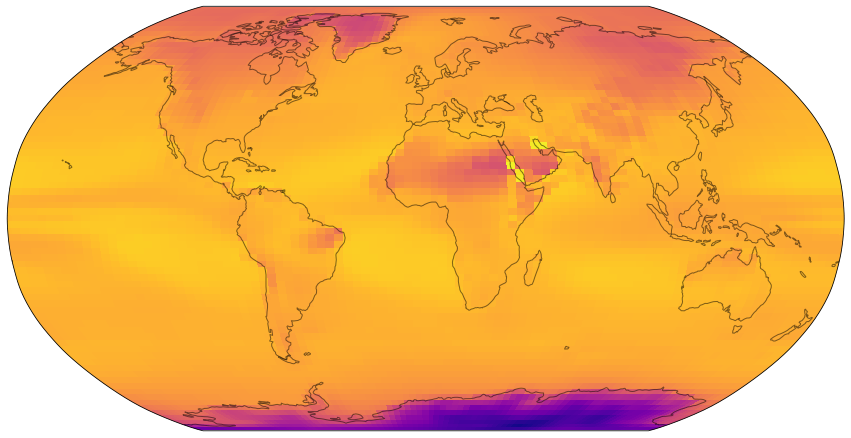

53
MODELTYPE :  UNet_flat
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  1
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 64)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise',)
S_MODE_TARGETS :  ('Pixelwise',)
loss :  MSELoss
optimizer :  Adam
RUN_NR :  3
#params :  647109


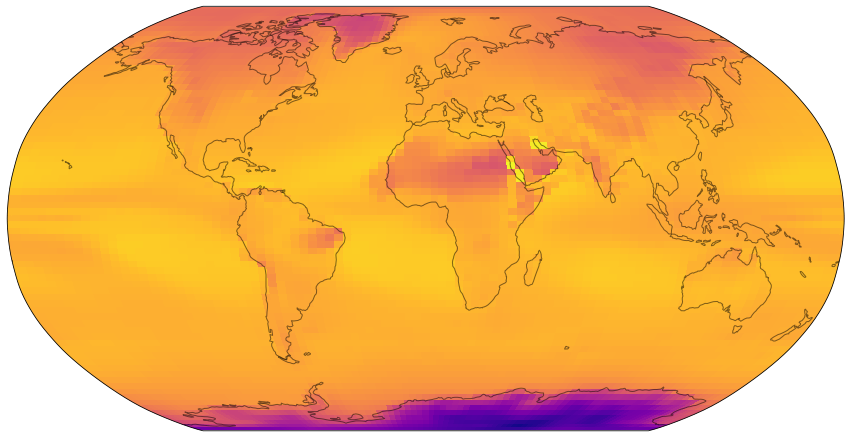

54
MODELTYPE :  UNet_flat
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  1
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 64)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise',)
S_MODE_TARGETS :  ('Pixelwise',)
loss :  MSELoss
optimizer :  Adam
RUN_NR :  1
#params :  647109


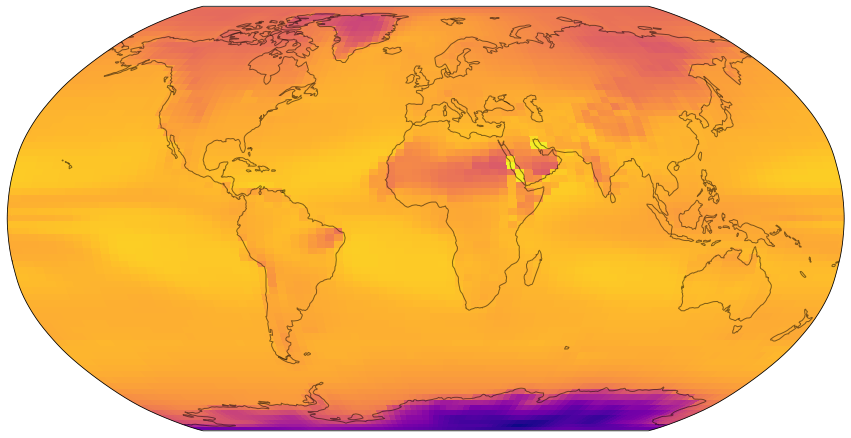

55
MODELTYPE :  UNet_flat
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  1
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 64)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise',)
S_MODE_TARGETS :  ('Pixelwise',)
loss :  MSELoss
optimizer :  Adam
RUN_NR :  9
#params :  647109


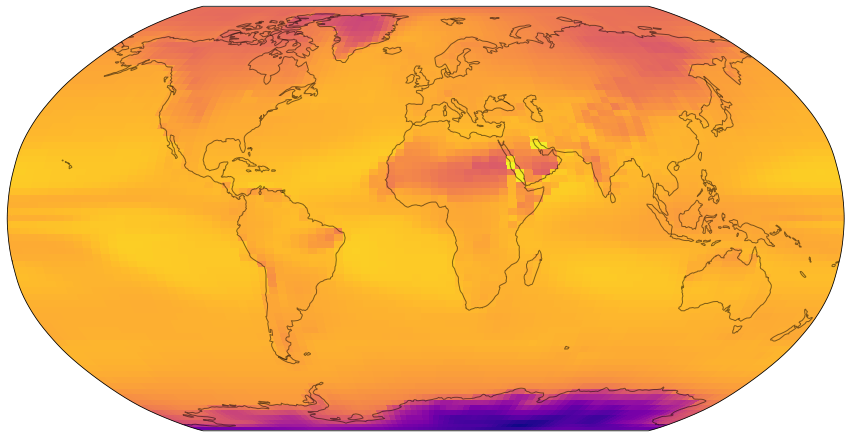

56
MODELTYPE :  UNet_flat
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  1
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 64)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise',)
S_MODE_TARGETS :  ('Pixelwise',)
loss :  MSELoss
optimizer :  Adam
RUN_NR :  0
#params :  647109


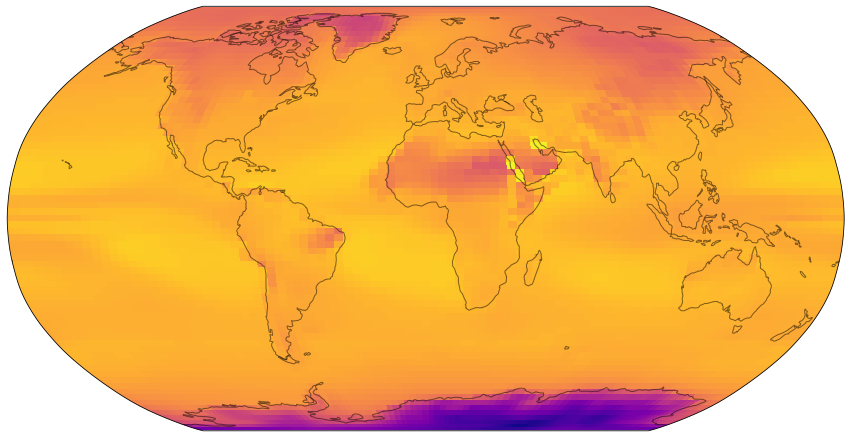

57
MODELTYPE :  UNet_flat
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  1
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 64)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise',)
S_MODE_TARGETS :  ('Pixelwise',)
loss :  MSELoss
optimizer :  Adam
RUN_NR :  8
#params :  647109


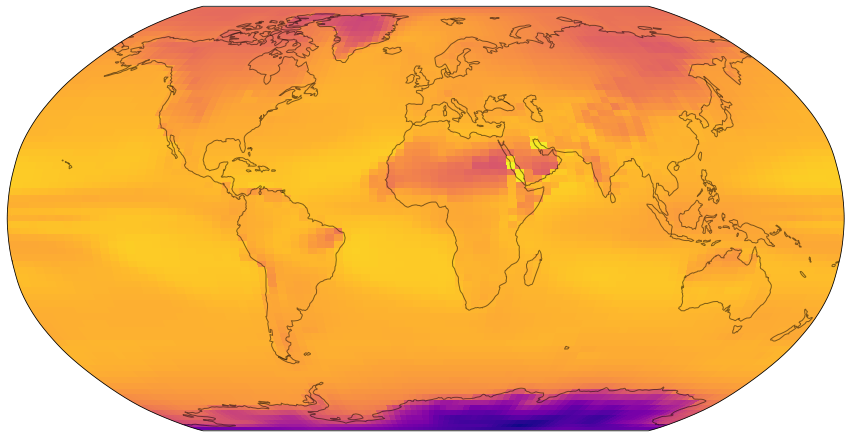

58
MODELTYPE :  UNet_flat
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  1
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 64)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise',)
S_MODE_TARGETS :  ('Pixelwise',)
loss :  MSELoss
optimizer :  Adam
RUN_NR :  7
#params :  647109


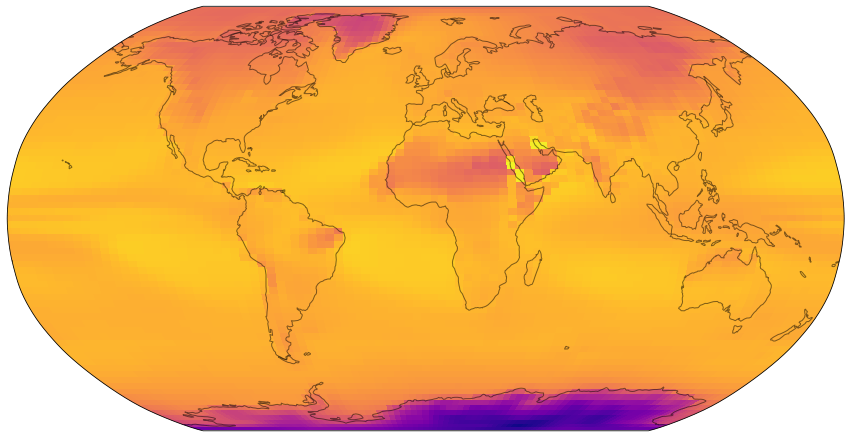

59
MODELTYPE :  UNet_flat
DEPTH :  3
NUM_EPOCHS :  early_stopping
BATCH_SIZE :  8
LEARNING_RATE :  0.005
IN_CHANNELS :  1
CHANNELS_FIRST_CONV :  32
OUT_CHANNELS :  1
FMAPS :  (32, 32, 64, 64)
USE_CYLINDRICAL_PADDING :  True
USE_COORD_CONV :  True
ACTIVATION :  <class 'torch.nn.modules.activation.ReLU'>
NORMALIZATION :  <class 'torch.nn.modules.batchnorm.BatchNorm2d'>
S_MODE_PREDICTORS :  ('Pixelwise',)
S_MODE_TARGETS :  ('Pixelwise',)
loss :  MSELoss
optimizer :  Adam
RUN_NR :  4
#params :  647109


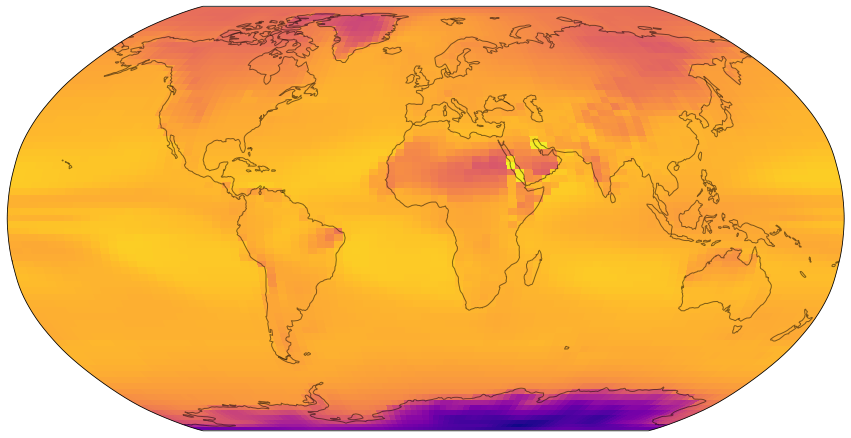

In [20]:
for i, i_j in enumerate(indices_dataset):
    print(i)
    # for key, value in dataset_descriptions[i_j].items():
        # print(key,": ", value)
    for key, value in model_descriptions[i].items():
        print(key,": ", value)
    plot_regular_lattice_map(rescaled_predictions[i][0,0,...], lat[indices_dataset[i]], lon[indices_dataset[i]], norm=norm)

In [21]:
def RMSE(predictions, targets):
    from sklearn.metrics import mean_squared_error
    rmse = np.zeros((predictions.shape[1]))
    for i in range(predictions.shape[1]):
        rmse[i] = mean_squared_error(targets[:,i], predictions[:,i], squared=False)
    return rmse

In [22]:
rmse = []
metric = []
for i in range(len(rescaled_predictions)):
    rmse.append(RMSE(d18O_test[indices_dataset[i]].reshape(d18O_test[indices_dataset[i]].shape[0],-1), \
                     rescaled_predictions[i].reshape(rescaled_predictions[i].shape[0],-1)).reshape(len(lat[indices_dataset[i]]), len(lon[indices_dataset[i]])))

    # compute explained variance by dividing rmse by standard-deviation on test set.
    metric.append(- rmse[-1]/np.std(d18O_test[indices_dataset[i]], axis=0).reshape(len(lat[indices_dataset[i]]), len(lon[indices_dataset[i]])) + 1 )

In [23]:
def plot_explained_variance(metric, lat, lon, figsize=(15,10), cbar_fontsize=15, projection=ccrs.Robinson(), 
                            title="", cbar_label="", norm=None, cmap=None, title_fontsize=15, savename=None, use_default_bounds=True):
    # plot RMSE/sigma - 1
    assert metric.shape == (len(lat), len(lon))
    
    #set up colormap
    colors = ["#67001f","#b2182b","#d6604d","#f4a582","#fddbc7","#d1e5f0","#92c5de","#4393c3","#2166ac","#053061"]
    
    if use_default_bounds:
        lim = 1 # math.ceil(np.max(metric))
        bounds = np.concatenate((np.array([-1.0,-0.8,-0.6,-0.4,-0.2]),np.linspace(0, lim, 6)))
    if cmap is None:
        cmap= matplotlib.colors.ListedColormap(colors)
    if norm is None:
        norm = matplotlib.colors.BoundaryNorm(bounds, cmap.N)
                          
    fig = plt.figure(figsize = figsize)
    ax = fig.add_subplot(1,1,1,projection = projection)
    ax.set_global()
    #remove white line
    field, lon_plot = add_cyclic_point(metric, coord = lon)
    lo, la = np.meshgrid(lon_plot, lat)
    layer = ax.pcolormesh(lo, la, field, transform=ccrs.PlateCarree(), cmap=cmap,norm=norm)
    
    if use_default_bounds:
        cbar = fig.colorbar(
            matplotlib.cm.ScalarMappable(cmap=cmap, norm=norm),
            ticks=bounds,
            spacing='proportional',
            orientation='horizontal',
            label='Discrete intervals, some other units',
        ) 
    else:
        cbar = fig.colorbar(
            matplotlib.cm.ScalarMappable(cmap=cmap, norm=norm),
            spacing='proportional',
            orientation='horizontal',
            label='Discrete intervals, some other units',
        )        
    if cbar_label == "":
        cbar.set_label(r"$R^2$ score", fontsize = cbar_fontsize)
    else:
        cbar.set_label(cbar_label, fontsize = cbar_fontsize)
        
    cbar.ax.tick_params(labelsize=20)
    
    ax.coastlines()

    # calculate the global average metric
    weights = np.tile(np.cos(np.deg2rad(lat))[:,None],len(lon))
    metric_global_av = np.average(metric, weights = weights)
    if title == "":
        ax.set_title(r"(Test-RMSE/$\sigma_{test}) - 1$, " + \
                     "Global area weighted average: {:.3f}".format(metric_global_av), fontsize=title_fontsize)
    else:
        ax.set_title(title, fontsize=title_fontsize)
        
    if savename is not None:
        plt.savefig(DIRECTORY_IMAGES+savename)

In [24]:
# for i in range(len(metric)):
    # print(model_descriptions[i]["RUN_NR"])
    # print(model_descriptions[i]["S_MODE_PREDICTORS"])    
    # print(model_descriptions[i]["S_MODE_TARGETS"])
    # print(dataset_descriptions[indices_dataset[i]]["predictor_variables"])
    
    # print(model_descriptions[i]["USE_CYLINDRICAL_PADDING"])
    # print(model_descriptions[i]["USE_COORD_CONV"])
    # print(model_descriptions[i]["loss"])
    # plot_explained_variance(metric[i], lat[indices_dataset[i]],lon[indices_dataset[i]], savename="flat_coord_conv_{}.jpg".format(i))
    # plt.show()

# Calculate averages over many runs

In [28]:
# if things that we want to average are not automatically ordered...

groups = []
indices_groups = []

for i in range(len(model_descriptions)):
    
    matches_group = np.array([dataset_descriptions[indices_dataset[i]]["predictor_variables"]  == dataset_descriptions[indices_dataset[group]]["predictor_variables"] for group in groups])
    """
    matches_group = np.array([dataset_descriptions[indices_dataset[i]]["DO_SHUFFLE"] and dataset_descriptions[indices_dataset[group]]["DO_SHUFFLE"] and \
                              dataset_descriptions[indices_dataset[i]]["DSET_NB"] and dataset_descriptions[indices_dataset[group]]["DSET_NB"]])
    """    
    if matches_group.any():
        indices_groups[np.where(matches_group == True)[0][0]].append(i)
        
    else:
        groups.append(i)
        indices_groups.append([])
        indices_groups[-1].append(i)
        
av_metric = np.zeros((len(groups),*metric[0].shape))
global_mean = np.zeros(len(groups))
global_std = np.zeros(len(groups))
# calculate global means and their standard deviations
for i in range(len(groups)):
    l = len(indices_groups[i])
    group_data = np.zeros((l, *metric[0].shape))
    for j, i_g in enumerate(indices_groups[i]):
        group_data[j] = metric[i_g]
    av_metric[i] = np.average(group_data, axis=0)
    
    weights = np.repeat(np.tile(np.cos(np.deg2rad(lat[0]))[:,None],len(lon[0]))[np.newaxis,...], repeats=l, axis=0)
    global_av_metric = np.average(group_data, weights = weights, axis=(1,2))
    global_mean[i] = np.mean(global_av_metric)
    global_std[i] = np.std(global_av_metric)

In [30]:
for i, group in enumerate(groups):
    print(dataset_descriptions[indices_dataset[group]]["predictor_variables"])

['temp_1', 'precip', 'ht']
['precip']
['temp_1', 'precip', 'p']
['temp_1', 'precip']
['p']
['temp_1']


In [36]:
i_precip = 1
i_tas = 4
i_slp = 5

i_singles = np.array([i_precip, i_tas, i_slp])

In [37]:
# Best architecture: UNet_deeper has index 2.
singles_metric = av_metric[i_singles]
singles_global_mean = global_mean[i_singles]
singles_global_std = global_std[i_singles]

In [41]:

title="${:.3f} \pm {:.3f}$".format(best_global_mean, best_global_std)

TypeError: unsupported format string passed to numpy.ndarray.__format__

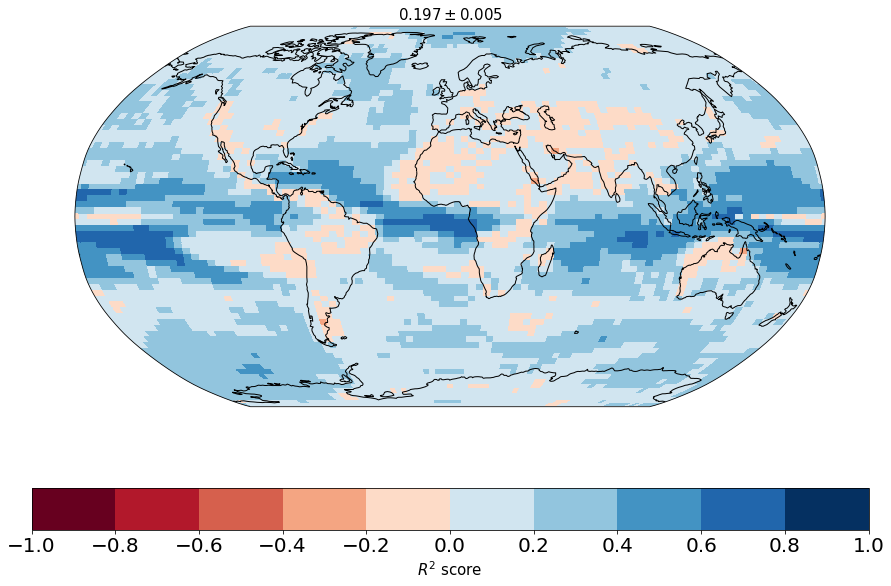

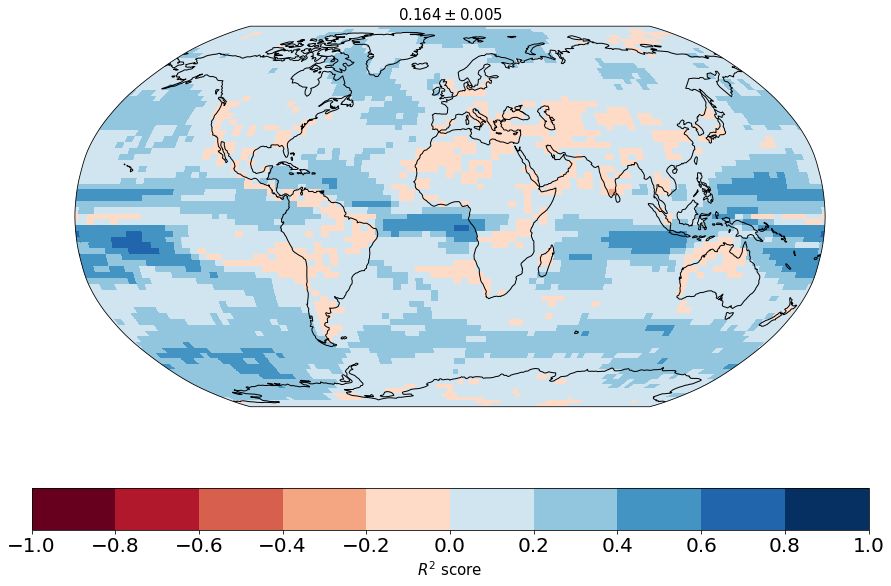

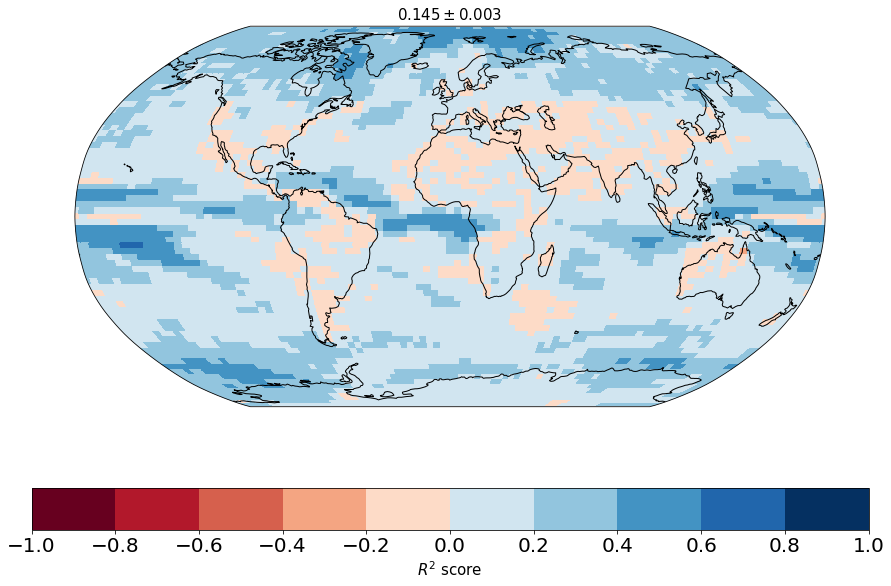

In [42]:
for i in range(len(i_singles)):
    plot_explained_variance(singles_metric[i], lat[indices_dataset[groups[i_singles[i]]]], lon[indices_dataset[groups[i_singles[i]]]], title="${:.3f} \pm {:.3f}$".format(singles_global_mean[i], singles_global_std[i]))


# timeseries for fixed positions

In [45]:
gt_timeseries = np.squeeze(d18O_test[0])
pred_timeseries_tas = np.squeeze([rescaled_predictions[i] for i in np.array(indices_groups[i_singles[1]],"int")])
pred_timeseries_precip = np.squeeze([rescaled_predictions[i] for i in np.array(indices_groups[i_singles[0]],"int")])
pred_timeseries_slp = np.squeeze([rescaled_predictions[i] for i in np.array(indices_groups[i_singles[2]],"int")])

In [46]:
def cor_fields(f1, f2):
    """Calculate pearson correlation coefficient for temporal correlation of 2 spatiotemporal fields"""
    from scipy.stats import pearsonr 
    pearson_correlation = np.zeros((f1.shape[1],f1.shape[2]))
    for i in range(f1.shape[1]):
        for j in range(f1.shape[2]):
            nas = np.logical_or(np.isnan(f1[:,i,j]), np.isnan(f2[:,i,j]))
            pearson_correlation[i,j] = pearsonr(f1[~nas,i,j],f2[~nas,i,j])[0]
    return pearson_correlation

In [47]:
def plot_timeseries(lat, lon, lat_array, lon_array, gt_timeseries, pred_timeseries,\
                    figsize=(14,9), xlims=None,savename=None):
    """
    For a given latitude and longitude plot the testset-timeseries at the closest gridbox.
    Mark missing values.
    
    Assume that the timeseries are in format (time, lat, lon).
    """
    lon = lon%360
    # get indices of closest box
    assert -90 <= lat <= 90
    
    assert len(pred_timeseries.shape) == 3 or len(pred_timeseries.shape) == 4 
    assert len(gt_timeseries.shape) == 3
    
    i_lat = (np.abs(lat_array - lat)).argmin()
    i_lon = (np.abs(lon_array - lon)).argmin()
    
    fig, ax = plt.subplots(figsize=figsize)
    
    fig.suptitle("Compare timeseries of prediction and groundtruth at {:.1f} lat., {:.1f} lon.".format(lat_array[i_lat], lon_array[i_lon]), fontsize=20)
    
    ax.plot(gt_timeseries[:,i_lat, i_lon], label='ground truth',color='k')
    if len(pred_timeseries.shape) == 4:
        metric = np.zeros((pred_timeseries.shape[0], len(lat_array), len(lon_array)))
        cor = np.zeros((pred_timeseries.shape[0], len(lat_array), len(lon_array)))
        
        for i in range(pred_timeseries.shape[0]):
            metric[i] = 1 - RMSE(gt_timeseries.reshape(gt_timeseries.shape[0],-1), \
                                 pred_timeseries[i].reshape(pred_timeseries[i].shape[0],-1)).reshape(len(lat_array), len(lon_array))/np.nanstd(gt_timeseries, axis=0, keepdims=True)
            metric[i] = np.squeeze(metric[i])
            cor[i] = cor_fields(pred_timeseries[i,...], gt_timeseries) 
            
        max_pred = np.amax(pred_timeseries, axis=0)
        min_pred = np.amin(pred_timeseries, axis=0)
        mean_pred = np.mean(pred_timeseries, axis=0)
        
        ax.plot(mean_pred[:,i_lat, i_lon], label='prediction, average', color="g")     
        ax.fill_between(np.arange(len(mean_pred[:,i_lat, i_lon])), min_pred[:,i_lat, i_lon], max_pred[:,i_lat, i_lon],\
                        label='min-max prediction', color="g", alpha=0.5)     
        metric_mean = np.mean(metric, axis=0)
        metric_std = np.std(metric, axis=0)
        cor_mean = np.mean(cor, axis=0)   
        cor_std = np.std(cor, axis=0)    
        
        ax.text(5, np.mean(pred_timeseries[...,i_lat, i_lon]) , "Cor: {:0.2f} +/- {:0.2f}, metric: {:0.2f} +/- {:0.2f}".format(cor_mean[i_lat, i_lon], cor_std[i_lat, i_lon], metric_mean[i_lat, i_lon], metric_std[i_lat, i_lon]), style='italic', fontsize=12,bbox={'facecolor': 'white', 'alpha': 1.0, 'pad': 10})
    else:
        ax.plot(pred_timeseries[:,i_lat, i_lon], label='prediction, av', color="g")  
        metric = 1 - RMSE(gt_timeseries.reshape(gt_timeseries.shape[0],-1), \
                          pred_timeseries.reshape(pred_timeseries.shape[0],-1)).reshape(len(lat_array), len(lon_array))/np.nanstd(gt_timeseries, axis=0, keepdims=True)
        metric = np.squeeze(metric)
        cor = cor_fields(pred_timeseries, gt_timeseries) 

        ax.text(5, np.mean(pred_timeseries[...,i_lat, i_lon]) , "Cor: {:0.2f}, metric: {:0.2f}".format(cor[i_lat, i_lon], metric[i_lat, i_lon]), style='italic', fontsize=12,
                 bbox={'facecolor': 'white', 'alpha': 1.0, 'pad': 10})
    if xlims is not None:
        plt.xlim(xlims)
    plt.legend(loc="upper right")
    plt.xlabel("timestep in test set")
    plt.ylabel(r"${}^{18}\delta(O)$ [permille]")    
    axins = inset_axes(ax, width="40%", height="40%", loc="lower right", 
                   axes_class=cartopy.mpl.geoaxes.GeoAxes, 
                   axes_kwargs=dict(map_projection=cartopy.crs.PlateCarree()))
    axins.set_extent((-180, 180, -90, 90), cartopy.crs.PlateCarree())
    #need weird trafo's because for some reasons coordinates reach from -180,180
    axins.plot((lon_array[i_lon]+180)%360-180, lat_array[i_lat],marker="*", color='g')
    axins.add_feature(cartopy.feature.COASTLINE)
    if savename is not None:
        plt.savefig(DIRECTORY_IMAGES + savename)        
    plt.show()
    plt.close()

In [48]:
def plot_timeseries_without_inset(lat, lon, lat_array, lon_array, gt_timeseries, pred_timeseries,\
                    figsize=(12,7), xlims=None,savename=None):
    """
    For a given latitude and longitude plot the testset-timeseries at the closest gridbox.
    Mark missing values.
    
    Assume that the timeseries are in format (time, lat, lon).
    """
    lon = lon%360
    # get indices of closest box
    assert -90 <= lat <= 90
    
    assert len(pred_timeseries.shape) == 3 or len(pred_timeseries.shape) == 4 
    assert len(gt_timeseries.shape) == 3
    
    i_lat = (np.abs(lat_array - lat)).argmin()
    i_lon = (np.abs(lon_array - lon)).argmin()
    print(i_lat, i_lon)
    fig, ax = plt.subplots(figsize=figsize)
    
    fig.suptitle("Compare timeseries of prediction and groundtruth at {:.1f} lat., {:.1f} lon.".format(lat_array[i_lat], lon_array[i_lon]), fontsize=15)
    
    ax.plot(gt_timeseries[:,i_lat, i_lon], label='ground truth',color='k')
    if len(pred_timeseries.shape) == 4:
        metric = np.zeros((pred_timeseries.shape[0], len(lat_array), len(lon_array)))
        cor = np.zeros((pred_timeseries.shape[0], len(lat_array), len(lon_array)))
        
        for i in range(pred_timeseries.shape[0]):
            metric[i] = 1 - RMSE(gt_timeseries.reshape(gt_timeseries.shape[0],-1), \
                                 pred_timeseries[i].reshape(pred_timeseries[i].shape[0],-1)).reshape(len(lat_array), len(lon_array))/np.nanstd(gt_timeseries, axis=0, keepdims=True)
            metric[i] = np.squeeze(metric[i])
            cor[i] = cor_fields(pred_timeseries[i,...], gt_timeseries) 
            
        max_pred = np.amax(pred_timeseries, axis=0)
        min_pred = np.amin(pred_timeseries, axis=0)
        mean_pred = np.mean(pred_timeseries, axis=0)
        
        ax.plot(mean_pred[:,i_lat, i_lon], label='prediction, average', color="g")     
        ax.fill_between(np.arange(len(mean_pred[:,i_lat, i_lon])), min_pred[:,i_lat, i_lon], max_pred[:,i_lat, i_lon],\
                        label='min-max prediction', color="g", alpha=0.5)     
        metric_mean = np.mean(metric, axis=0)
        metric_std = np.std(metric, axis=0)
        cor_mean = np.mean(cor, axis=0)   
        cor_std = np.std(cor, axis=0)    
        
        ax.text(0.3, 0.1 , "Cor: {:0.3f} +/- {:0.3f}, metric: {:0.3f} +/- {:0.3f}".format(cor_mean[i_lat, i_lon], cor_std[i_lat, i_lon], metric_mean[i_lat, i_lon], metric_std[i_lat, i_lon]), \
                style='italic', fontsize=12,bbox={'facecolor': 'white', 'alpha': 1.0, 'pad': 10}, horizontalalignment='center',\
                verticalalignment='center', transform = ax.transAxes)
    else:
        ax.plot(pred_timeseries[:,i_lat, i_lon], label='prediction, av', color="g")  
        metric = 1 - RMSE(gt_timeseries.reshape(gt_timeseries.shape[0],-1), \
                          pred_timeseries.reshape(pred_timeseries.shape[0],-1)).reshape(len(lat_array), len(lon_array))/np.nanstd(gt_timeseries, axis=0, keepdims=True)
        metric = np.squeeze(metric)
        cor = cor_fields(pred_timeseries, gt_timeseries) 

        ax.text(0, np.mean(pred_timeseries[...,i_lat, i_lon]) , "Cor: {:0.3f}, metric: {:0.3f}".format(cor[i_lat, i_lon], metric[i_lat, i_lon]), style='italic', fontsize=12,
                 bbox={'facecolor': 'white', 'alpha': 1.0, 'pad': 10})
    if xlims is not None:
        plt.xlim(xlims)
    plt.legend(loc="upper right")
    plt.xlabel("timestep in test set")
    plt.ylabel(r"${}^{18}\delta(O)$ [permille]")
    """
    axins = inset_axes(ax, width="40%", height="40%", loc="lower right", 
                   axes_class=cartopy.mpl.geoaxes.GeoAxes, 
                   axes_kwargs=dict(map_projection=cartopy.crs.PlateCarree()))
    axins.set_extent((-180, 180, -90, 90), cartopy.crs.PlateCarree())
    #need weird trafo's because for some reasons coordinates reach from -180,180
    axins.plot((lon_array[i_lon]+180)%360-180, lat_array[i_lat],marker="*", color='g')
    axins.add_feature(cartopy.feature.COASTLINE)
    """
    if savename is not None:
        plt.savefig(DIRECTORY_IMAGES + savename)        
    plt.show()
    plt.close()

5 85


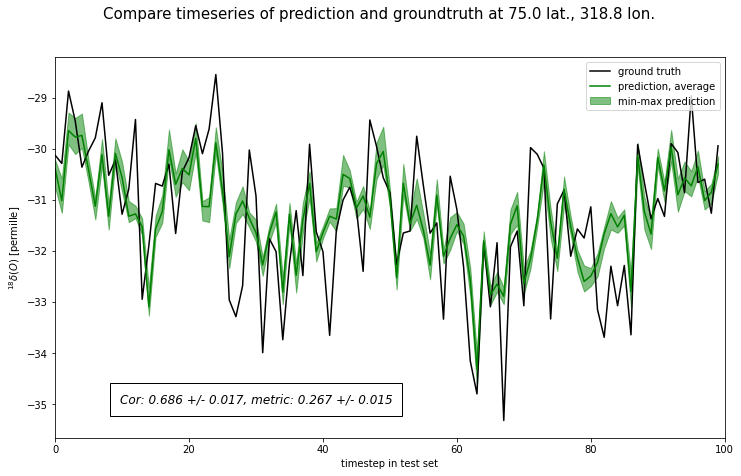

67 66


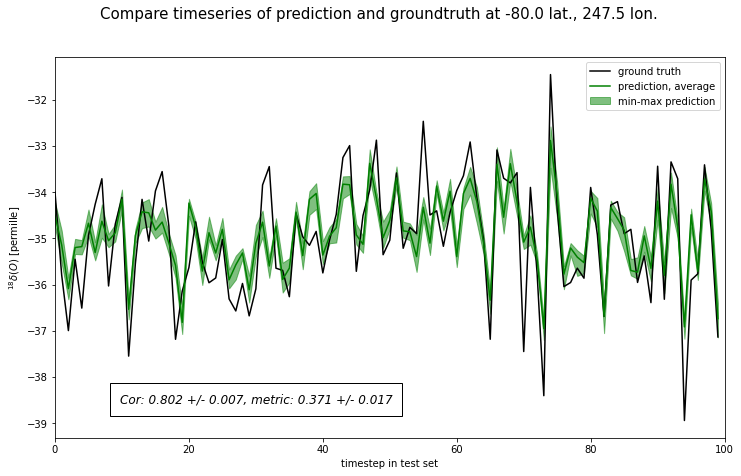

65 33


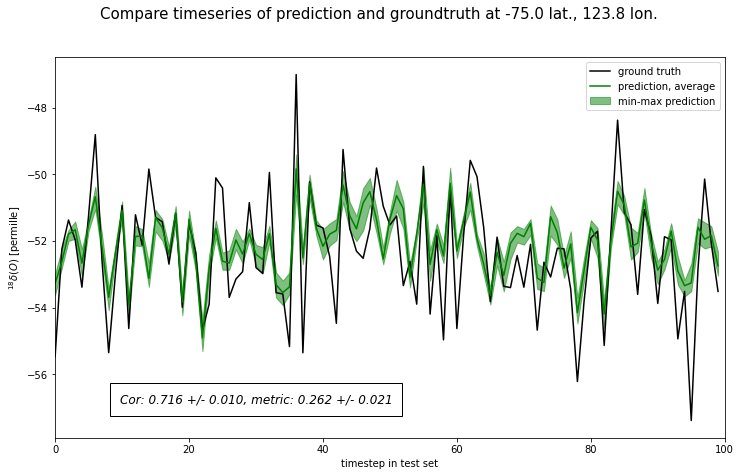

65 0


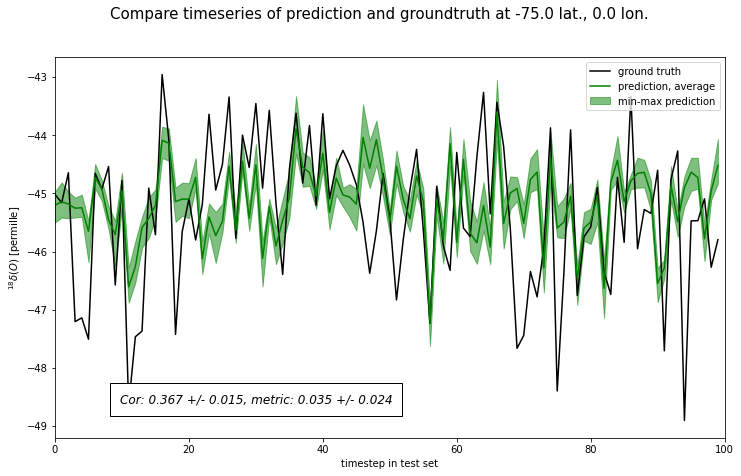

In [54]:
plot_timeseries_without_inset(75.1, -42.3, lat[0], lon[0], gt_timeseries,\
                pred_timeseries_slp, xlims=[0,100])#, savename="timeseries_no_inset_NGRIP.png")
plot_timeseries_without_inset(-79.5, -112.1, lat[0], lon[0], gt_timeseries,\
                pred_timeseries_slp, xlims=[0,100])#, savename="timeseries_no_inset_WAIS.png")
plot_timeseries_without_inset(-75.1, 123.2, lat[0], lon[0], gt_timeseries,\
                pred_timeseries_slp, xlims=[0,100])#, savename="timeseries_no_inset_DOME_C.png")
plot_timeseries_without_inset(-75.0, 0.04, lat[0], lon[0], gt_timeseries,\
                pred_timeseries_slp, xlims=[0,100])#, savename="timeseries_no_inset_Kohnen.png")


5 85


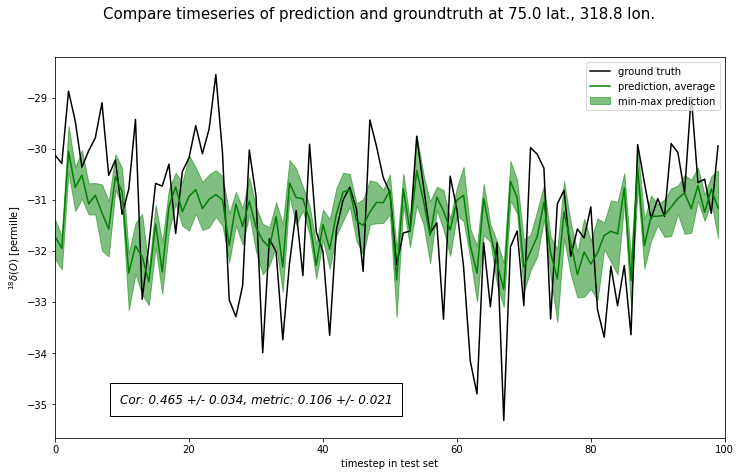

67 66


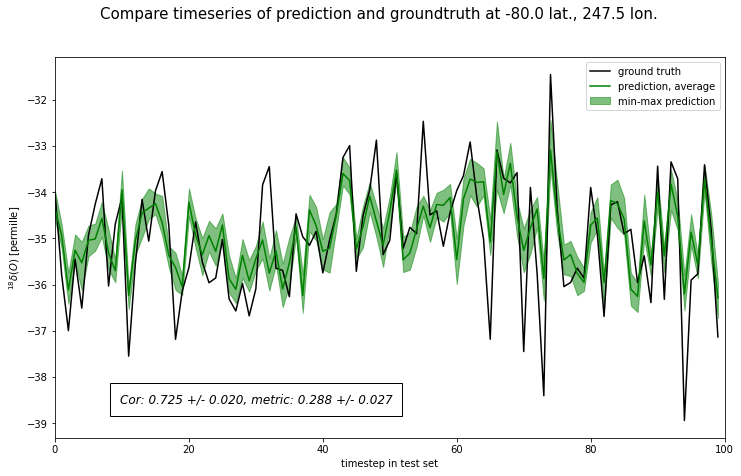

65 33


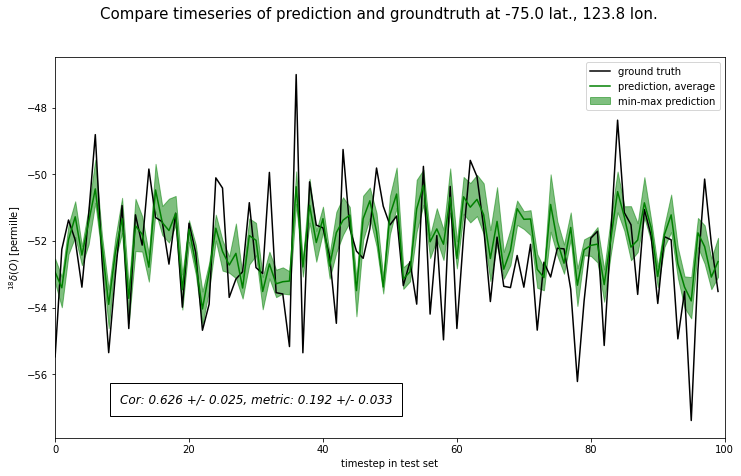

65 0


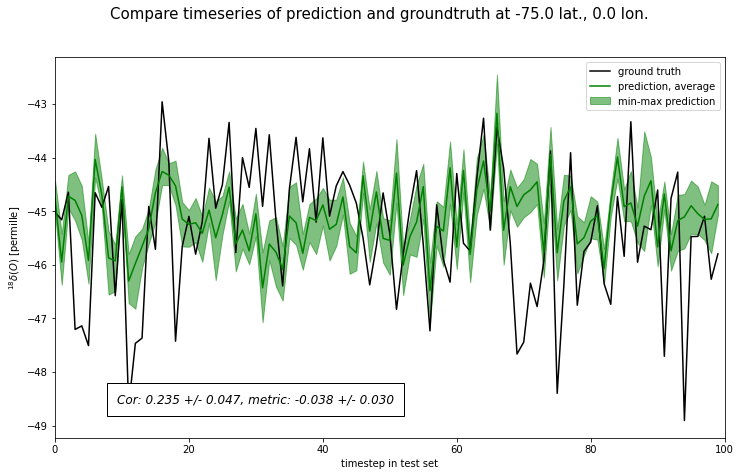

In [55]:
plot_timeseries_without_inset(75.1, -42.3, lat[0], lon[0], gt_timeseries,\
                pred_timeseries_tas, xlims=[0,100])
plot_timeseries_without_inset(-79.5, -112.1, lat[0], lon[0], gt_timeseries,\
                pred_timeseries_tas, xlims=[0,100])
plot_timeseries_without_inset(-75.1, 123.2, lat[0], lon[0], gt_timeseries,\
                pred_timeseries_tas, xlims=[0,100])
plot_timeseries_without_inset(-75.0, 0.04, lat[0], lon[0], gt_timeseries,\
                pred_timeseries_tas, xlims=[0,100])


5 85


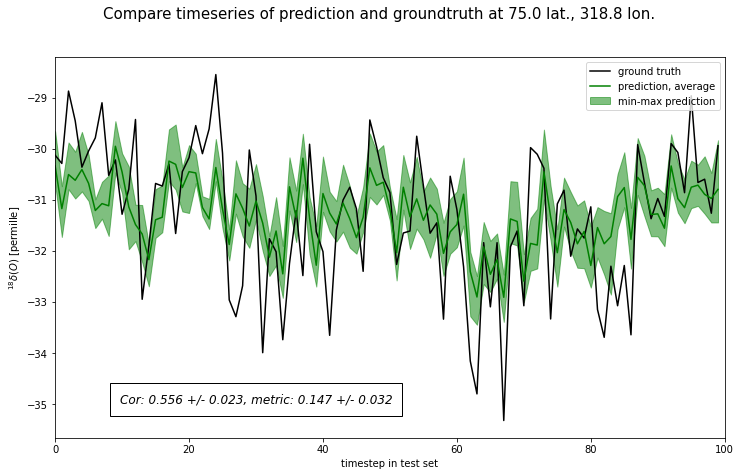

67 66


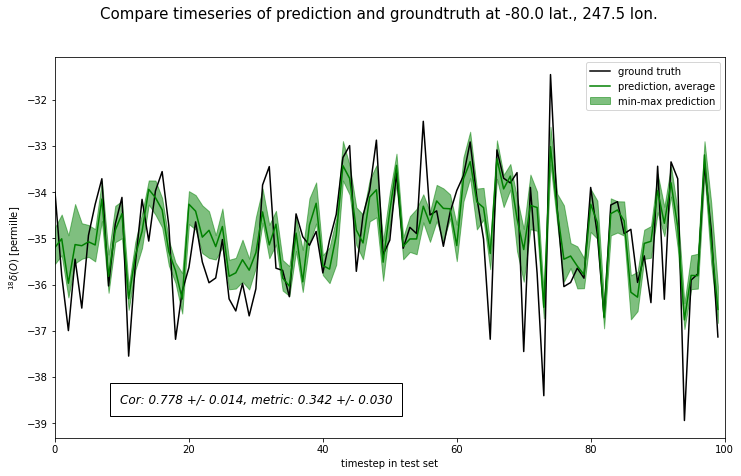

65 33


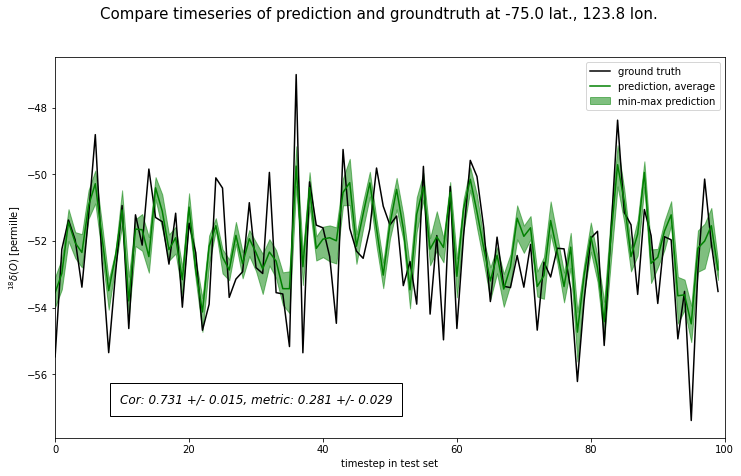

65 0


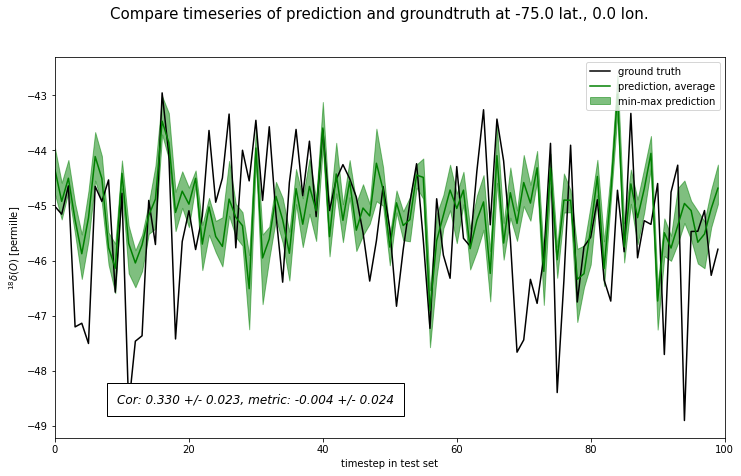

In [56]:
plot_timeseries_without_inset(75.1, -42.3, lat[0], lon[0], gt_timeseries,\
                pred_timeseries_precip, xlims=[0,100])
plot_timeseries_without_inset(-79.5, -112.1, lat[0], lon[0], gt_timeseries,\
                pred_timeseries_precip, xlims=[0,100])
plot_timeseries_without_inset(-75.1, 123.2, lat[0], lon[0], gt_timeseries,\
                pred_timeseries_precip, xlims=[0,100])
plot_timeseries_without_inset(-75.0, 0.04, lat[0], lon[0], gt_timeseries,\
                pred_timeseries_precip, xlims=[0,100])

In [71]:
def find_gridbox(array, value):
    array = np.asarray(array)
    idx = (np.abs(array - value)).argmin()
    return idx

def plot_testset_sites(locs, metric, lat, lon, locs_labels=None, title_fontsize=15, title=""):
    """ Get timeseries plots at the given locations (each location assumed to be given in (lat, lon) (degrees))"""
    locs_boxes = np.zeros_like(locs,dtype='int')
    for i, loc in enumerate(locs):
        locs_boxes[i,0] = int(find_gridbox(lat, loc[0]))
        locs_boxes[i,1] = int(find_gridbox(lon, loc[1]))
    
    # define markers that can be used:
    markers = ["o","p","P","*","D"]
    # make sure we have enough markers
    assert len(locs) < len(markers)
    
    ### Initial plot
    #set up colormap
    colors = ["#67001f","#b2182b","#d6604d","#f4a582","#fddbc7","#d1e5f0","#92c5de","#4393c3","#2166ac","#053061"]
    lim = math.ceil(np.max(metric))
    bounds = np.concatenate((np.array([-1.0,-0.8,-0.6,-0.4,-0.2]),np.linspace(0, lim, 6)))
    cmap= matplotlib.colors.ListedColormap(colors)
    norm = matplotlib.colors.BoundaryNorm(bounds, cmap.N)
                        
    fig = plt.figure(figsize = (14,10))
    ax = fig.add_subplot(1,1,1,projection = ccrs.Robinson())
    ax.set_global()
    #remove white line
    field, lon_plot = add_cyclic_point(metric, coord = lon)
    lo, la = np.meshgrid(lon_plot, lat)
    layer = ax.pcolormesh(lo, la, field, transform=ccrs.PlateCarree(), cmap=cmap,norm=norm)
    
    for i in range(len(locs_boxes)):
        if locs_labels == None:
            ax.plot(locs[i,1],locs[i,0], marker=markers[i], linestyle="None", color="k", markersize=9, transform=ccrs.Geodetic())
        else:
            ax.plot(locs[i,1],locs[i,0], marker=markers[i], linestyle="None", color="k", markersize=9, transform=ccrs.Geodetic(), label=locs_labels[i])
       
    cbar = fig.colorbar(
        matplotlib.cm.ScalarMappable(cmap=cmap, norm=norm),
        ticks=bounds,
        spacing='proportional',
        orientation='horizontal',
        label='Discrete intervals, some other units',
    ) 
    cbar.set_label(r"$R^2$", fontsize = 15)
    cbar.ax.tick_params(labelsize=20)
    
    ax.coastlines()

    if locs_labels != None:
        plt.legend()
    
    # calculate the global average metric
    weights = np.tile(np.cos(np.deg2rad(lat))[:,None],len(lon))
    metric_global_av = np.average(metric, weights = weights)
    
    if title == "":
        ax.set_title(r"(Test-RMSE/$\sigma_{test}) - 1$, " + \
                     "Global area weighted average: {:.3f}".format(metric_global_av), fontsize=title_fontsize)
    else:
        ax.set_title(title, fontsize=title_fontsize)
        
    plt.savefig(DIRECTORY_IMAGES + "best_drilling_sites_map.pdf")
    plt.savefig(DIRECTORY_IMAGES + "best_drilling_sites_map.png")
    plt.savefig(DIRECTORY_IMAGES + "best_drilling_sites_map.jpg")
    plt.show()
    plt.close()

In [72]:
locs = np.array([[-79.5,-112.1],[75.1,-42.3]]) # ,[-75.1, 123.4],[-75.0, 0.1]])
locs[:,1] = locs[:,1]%360
locs_labels = ["WAIS Divide", "NGRIP"] # ,"EPICA - Concordia", "EPICA - Kohnen"]

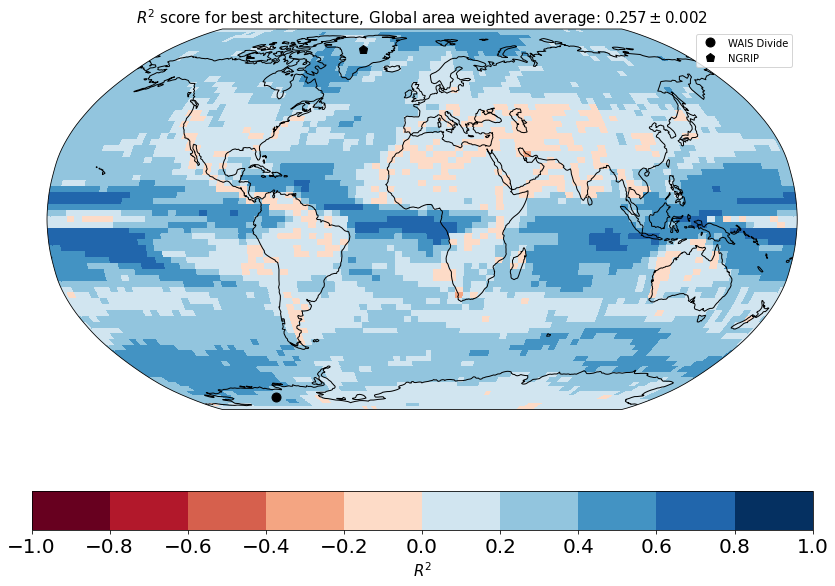

In [73]:
plot_testset_sites(locs, best_metric, lat[indices_dataset[groups[i_best]]], lon[indices_dataset[groups[i_best]]],\
                   locs_labels=locs_labels, title=r"$R^2$ score for best architecture, Global area weighted average: ${:.3f} \pm {:.3f}$".format(best_global_mean, best_global_std))